MIT License

Copyright (c) 2024 Philip Barthelmä

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

<div class="alert alert-warning">
   
### Z boson analysis for physics laboratory courses using CERN Open Data

Author: Philip Barthelmä, December 2024

This Jupyter Notebook contains the code behind the thesis $ \textit{ Z boson analysis for physics laboratory courses using CERN Open Data}$ and may be used as the basis for a physics laboratory course. A detailed describtion of the analysis can be found in the accompanying thesis, but a basic outline is given below. The analysis is based on two dataset provided through the Cern Open Data portal:

- Wunsch, Stefan; (2021). Run2012B_DoubleMuParked dataset in reduced NanoAOD format for education and outreach. CERN Open Data Portal. DOI:10.7483/OPENDATA.CMS.04XV.ESBR ( https://opendata.cern.ch/record/12365 )

- Wunsch, Stefan; (2021). Run2012C_DoubleMuParked dataset in reduced NanoAOD format for education and outreach. CERN Open Data Portal. DOI:10.7483/OPENDATA.CMS.86ZS.7G78 ( https://opendata.cern.ch/record/12366 )

Goal of the laboratory course is to familiarize students with the basics of modern data analysis by calculating the decay width of the Z boson.
This is achieved by estimating the detector resolution using the $J/\Psi$ resonance and extrapolating the result to the energies of the Z boson. To keep the analysis simple, only the influence of the muons transverse momenta as well as pseudorapidities are considered, leading to the formula

\begin{equation}
    \frac{\Delta M}{M} = \frac{1}{2}  \sqrt{ \left( \frac{\Delta p_{T,1} }{p_{T,1}} \right)^2 
  +\left( \frac{\Delta p_{T,2} }{p_{T,2}}  \right)^2 +k_{\eta}^2}.
\end{equation}

The individual contributions are estimated by creating suitable subsets of the data, such that only one of the terms has a significant influence on the resulting resolution. 

The analysis is comprised of four main parts:

- 1 Determining the contribution $k_\eta$
- 2 Determining the momentum resolution $\frac{\Delta p_{T,i}}{p_{T,i}}$
- 3 Estimating the accuracy of the mass resolution extrapolation
- 4 Analyzing the Z resonance
        
</div>

In [1]:
#### for location performance imporvement opportunitys 
#shows execution time of each cell
%load_ext autotime 

In [2]:
#### imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import vector as vec
import kafe2 as kfe
from scipy.special import voigt_profile as voigt 
from scipy.optimize import curve_fit 
import uncertainties as unc
from uncertainties import unumpy as unp

#set basic plt fig size params
plt.rcParams["figure.figsize"] = (6.4,4.8)
plt.rcParams.update({'figure.autolayout': True})
plt.rcParams['axes.xmargin'] = 0

m_mu = 0.1056583745 #mass myon in GeV

In [3]:
#### Fit Models

#Model for JPsi Resonance with quadratic model for noise:
def jpsiModel(x, mu, sigma,a,b,c,Ns,Nb):
    gauss = Ns * (np.exp(-0.5 * ((x - mu) / sigma) ** 2) / np.sqrt(2.0 * np.pi * sigma** 2))
    x0 = jpsiStart
    x1 = jpsiEnd 
    m = np.mean(jpsi.M.to_numpy())
    normConst = ((x1-x0)*(a*x1**2+(a*(x0-3*m)+b)*x1+a*x0**2-(3*a*m-b)*x0+3*a*m**2-2*b*m+2*c-a))/2
    back = (Nb/normConst) * ((a*(3*(x-m)**2-1))/2+b*(x-m)+c)
    return gauss + back

#Model for Z resonance with linear model for noise:
def zModel(x,sigma,Gamma,mu,a,b,Ns,Nb):
    voigtprofile = Ns * voigt(x-mu,sigma,0.5*Gamma)
    x0 = zbosonStart
    x1 = zbosonEnd
    m = np.mean(zboson.M.to_numpy())
    normConst = -0.5*(x1-x0)*(a*(2*m-x1-x0)-2*b)
    back = Nb/normConst * (a*(x-m)+b)
    return voigtprofile + back

In [4]:
# read data

#Original data taken from:
#https://opendata.cern.ch/record/12365
#https://opendata.cern.ch/record/12366

data = pd.read_csv('CSVData/Run2012BC_DoubleMuons_prefiltered.zip', compression='zip',header=[0,1])

data

mu1                                                        \
              Iso3  Q       dxy        dz       eta       phi         pt   
0         0.006498  1  0.001641  0.004744  0.091344 -1.409967  56.900930   
1         1.244928  1 -0.000153  0.011946 -0.676351 -2.748835  17.309220   
2         0.877325  1  0.015262 -0.029335 -0.605774 -2.633774  17.548424   
3         1.051922  1 -0.006767  0.001456 -2.116007 -0.192693  11.531023   
4         0.361009  1 -0.000451  0.951055  2.320034 -2.977990   7.915634   
...            ... ..       ...       ...       ...       ...        ...   
25052238  0.032155 -1  0.000833 -0.000580 -0.346839 -1.466133  34.915478   
25052239  0.128789  1 -0.030806  0.067267  0.230319 -0.514094   8.320309   
25052240  0.000000 -1  0.000325 -0.001486  1.304013  2.583171  42.090843   
25052241  1.115216  1 -0.000579  0.002700  0.333813  2.523907   8.658760   
25052242  0.000000  1 -0.000447 -0.002219  0.460759  1.654328  21.872807   

               mu2                                                        
              Iso3  Q       dxy        dz       eta       phi         pt  
0         0.000000 -1  0.000278 -0.001960 -0.472488  1.688872  34.670677  
1         3.274258  1 -0.007036 -0.006893 -0.535394  0.050149  10.619157  
2         6.176029 -1  0.002489  0.009315  0.265170  0.087667  11.469824  
3         0.838458 -1 -0.002096  0.022453 -1.491145 -1.541487  17.382690  
4         0.508661 -1  0.006500  0.019378  1.026221  2.870090  15.961810  
...            ... ..       ...       ...       ...       ...        ...  
25052238  0.029024  1  0.001952 -0.003038 -0.313330  1.776086  38.507280  
25052239  0.082093 -1 -0.028574 -0.009275  0.410674 -0.560857  13.053062  
25052240  0.035290  1 -0.001328  0.000670  0.094415 -0.940269  37.137700  
25052241  0.242068 -1 -0.000609 -0.002643  0.207239  2.332713  17.250345  
25052242  0.091350 -1  0.001896 -0.000224  0.578330  1.982666  11.697999  

[25052243 rows x 14 columns]

In [5]:
#Preparing the dataset for analysis

#define 4 vector for myons to calculate invariant mass efficiently
mass = np.ones(len(data.mu1.pt.to_numpy())) * m_mu

v4_mu1 = vec.array({"pt":   data.mu1.pt.to_numpy(), 
                    "eta":  data.mu1.eta.to_numpy(), 
                    "phi":  data.mu1.phi.to_numpy(), 
                    "mass": mass})

v4_mu2 = vec.array({"pt":   data.mu2.pt.to_numpy(), 
                    "eta":  data.mu2.eta.to_numpy(), 
                    "phi":  data.mu2.phi.to_numpy(), 
                    "mass": mass})

#calculate invariant mass
data["M"] = (v4_mu1+v4_mu2).mass

#calculate distance to primary Vertex for noise filtering
data["mu1","ds"] = np.sqrt(data.mu1.dxy.to_numpy() **2 + data.mu1.dz.to_numpy() **2)
data["mu2","ds"] = np.sqrt(data.mu2.dxy.to_numpy() **2 + data.mu2.dz.to_numpy() **2)

#filter out Dimyon events
data = data[data["mu1","Q"] + data["mu2","Q"] == 0]
data = data.sort_index(axis=1)

data

M       mu1                                             \
                         Iso3  Q        ds       dxy        dz       eta   
0         92.366513  0.006498  1  0.005020  0.001641  0.004744  0.091344   
2         30.540502  0.877325  1  0.033068  0.015262 -0.029335 -0.605774   
3         19.836849  1.051922  1  0.006922 -0.006767  0.001456 -2.116007   
4         16.318465  0.361009  1  0.951055 -0.000451  0.951055  2.320034   
5         92.890014  0.000000 -1  0.001670  0.000715 -0.001509 -2.166029   
...             ...       ... ..       ...       ...       ...       ...   
25052238  73.252661  0.032155 -1  0.001015  0.000833 -0.000580 -0.346839   
25052239   1.956354  0.128789  1  0.073986 -0.030806  0.067267  0.230319   
25052240  92.776260  0.000000 -1  0.001522  0.000325 -0.001486  1.304013   
25052241   2.808797  1.115216  1  0.002761 -0.000579  0.002700  0.333813   
25052242   5.561153  0.000000  1  0.002263 -0.000447 -0.002219  0.460759   

                                    mu2                                   \
               phi         pt      Iso3  Q        ds       dxy        dz   
0        -1.409967  56.900930  0.000000 -1  0.001980  0.000278 -0.001960   
2        -2.633774  17.548424  6.176029 -1  0.009642  0.002489  0.009315   
3        -0.192693  11.531023  0.838458 -1  0.022550 -0.002096  0.022453   
4        -2.977990   7.915634  0.508661 -1  0.020439  0.006500  0.019378   
5         1.001865  44.412205  0.007260  1  0.001528  0.001116 -0.001044   
...            ...        ...       ... ..       ...       ...       ...   
25052238 -1.466133  34.915478  0.029024  1  0.003611  0.001952 -0.003038   
25052239 -0.514094   8.320309  0.082093 -1  0.030042 -0.028574 -0.009275   
25052240  2.583171  42.090843  0.035290  1  0.001487 -0.001328  0.000670   
25052241  2.523907   8.658760  0.242068 -1  0.002712 -0.000609 -0.002643   
25052242  1.654328  21.872807  0.091350 -1  0.001909  0.001896 -0.000224   

                                         
               eta       phi         pt  
0        -0.472488  1.688872  34.670677  
2         0.265170  0.087667  11.469824  
3        -1.491145 -1.541487  17.382690  
4         1.026221  2.870090  15.961810  
5        -2.181235 -2.263137  48.753174  
...            ...       ...        ...  
25052238 -0.313330  1.776086  38.507280  
25052239  0.410674 -0.560857  13.053062  
25052240  0.094415 -0.940269  37.137700  
25052241  0.207239  2.332713  17.250345  
25052242  0.578330  1.982666  11.697999  

[21359721 rows x 17 columns]

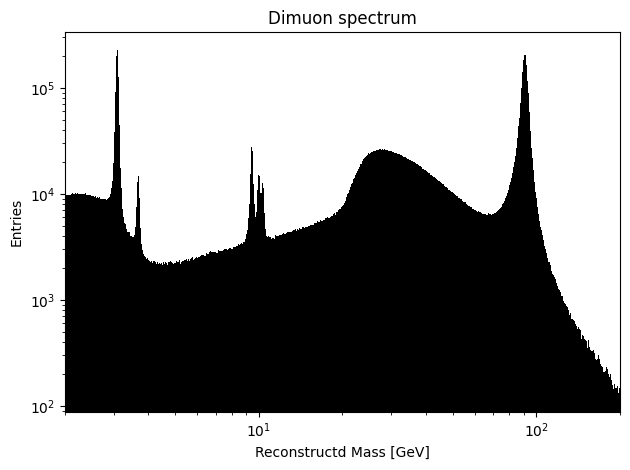

In [6]:
#plot entire spectrum
Mmn=0.5
Mmx=200.
bins = np.exp(np.linspace(np.log(Mmn), np.log(Mmx), 2000))
plt.hist(data['M'], bins = bins, color = "black")
plt.xscale('log')
plt.xlim(left = 2)
plt.title("Dimuon spectrum")
plt.xlabel("Reconstructd Mass [GeV]")
plt.ylabel("Entries")
plt.yscale('log')
plt.show()

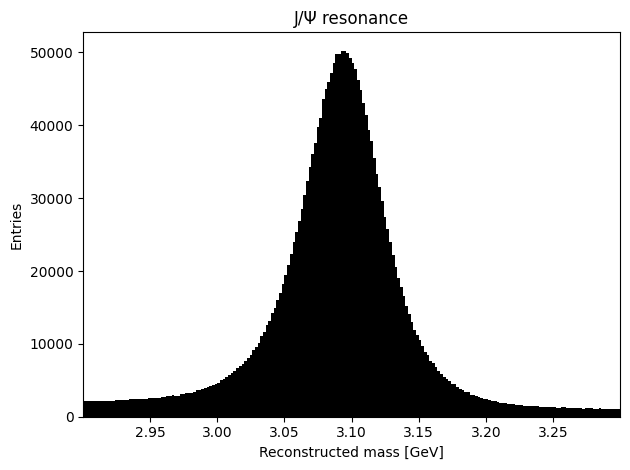

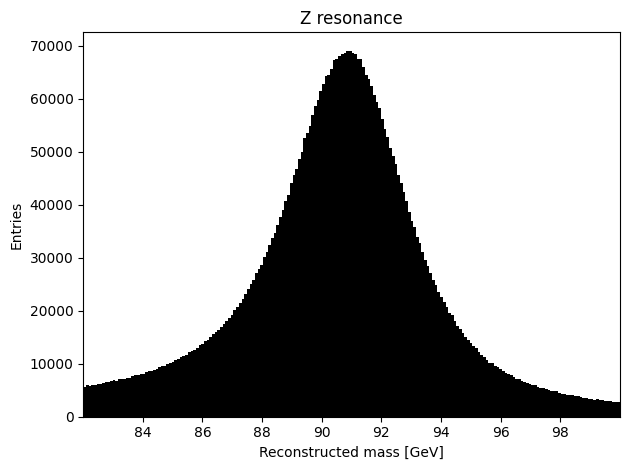

In [7]:
#filter out jpsi and zboson peaks

#start- and endpoint for each resonance in the dimuon spectrum
jpsiStart = 2.9
jpsiEnd = 3.3
zbosonStart = 82 
zbosonEnd = 100

jpsi   = data[(data.M > jpsiStart) & (data.M < jpsiEnd)]
zboson = data[(data.M > zbosonStart)  & (data.M < zbosonEnd)]

#plot respective resonances
plt.hist(jpsi.M, bins = 200, color = "black")
plt.title("J/Ψ resonance")
plt.xlabel("Reconstructed mass [GeV]")
plt.ylabel("Entries")
plt.show()

plt.hist(zboson.M, bins = 200, color = "black")
plt.title("Z resonance")
plt.xlabel("Reconstructed mass [GeV]")
plt.ylabel("Entries")
plt.show()

In [8]:
#Function for selecting subsets from the full dataset for further analysis

def partition(df, xcuts, ycuts, threshhold = 0, showPlot = True, diagOnly = False, title = "Partitioned Data", path = "", xlim = 0, ylim = 0, legend = False):

    """
    Creates partitions of a pt scatterplot.

    Args:
        df (dataframe): dataframe containing the dataset 
        xcuts (float array): array of x coordinates where data is to be sliced
        ycuts (float array): array of y coordinates where data is to be liced
        threshhold (int): partitions with fewer than thresshold datapoints are not created
        showPlot (bool): displays plot of partitions if true
        diagOnly (bool): only creates partitions on the diagonal of grid defined by xcuts / ycuts
        title (str): manually set title of Plot
        path (str): path where plot is stored. Not saved if empty
        xlim (int): manually set length of x axis
        ylim (int): manually set length of y axis
        legend (bool): display legend 

    Returns:
        areas (str list): Names of all created partitions
        subsets (dataframe): dataframe containing all partitions
    """
    
    partitions = [] #list of df's each contatining data of one partition
    
    for i in range(len(xcuts)-1):
        for j in range(len(ycuts)-1):
            
            if(diagOnly and i!=j):
                continue
            
            area = "sub" + str(i) + str(j) #as in sub00 for bottom left corner
            
            pt1Filter = (df.mu1.pt > xcuts[i]) & (df.mu1.pt < xcuts[i+1])
            pt2Filter = (df.mu2.pt > ycuts[j]) & (df.mu2.pt < ycuts[j+1])
            Filter = (pt1Filter & pt2Filter)
        
            numberOfDataPointsInPartition = len(df[Filter].M.to_numpy())
            
            if(numberOfDataPointsInPartition >= threshhold):
                
                #create df for this partition
                dfPartition = pd.DataFrame(columns = pd.MultiIndex.from_arrays([3*[area],["M","mu1pt","mu2pt"]])) 
                
                dfPartition[area, "mu1pt"] = df[Filter].mu1.pt
                dfPartition[area, "mu2pt"] = df[Filter].mu2.pt
                dfPartition[area, "M"]     = df[Filter].M
                dfPartition.reset_index(drop=True, inplace = True)
                partitions.append(dfPartition)
    
    if len(partitions) != 0 :
        subsets = pd.concat(partitions, axis=1)
        subsets = subsets.sort_index(axis=1)
    else:
        print("Not enough data to create Partitioning")
        return(0,0)
    
    #save names of areas seperately
    areas = []
    [areas.append(tupel[0]) for tupel in subsets.columns]
    areas = np.sort(list(set(areas)))
    
    #plot result
    if showPlot == True:
        fig, ax = plt.subplots()
    
        ax.scatter(df.mu1.pt.to_numpy(),df.mu2.pt.to_numpy(), marker = ".", color = "black", alpha = 0.1, linewidth = 0, s=10)
        for area in areas:
            ax.scatter(subsets[area,"mu1pt"].to_numpy(),subsets[area,"mu2pt"].to_numpy(), marker = ".", alpha = 0.2, linewidth = 0, s=10, label = area)
           
        if xlim != 0 and ylim != 0:
            ax.set_xlim(0,xlim)
            ax.set_ylim(0,ylim)
        else:   
            maxCut = max(xcuts[-1]+50,ycuts[-1]+50)
            ax.set_xlim(0,maxCut)
            ax.set_ylim(0,maxCut)
        ax.set_title(title)
        ax.set_xlabel("$p_{T,1}$ [GeV]")
        ax.set_ylabel("$p_{T,2}$ [GeV]")
        if path != "":
            fig.savefig(path +".jpg",bbox_inches='tight', dpi=400)
        if legend == True:
            lgnd = plt.legend(loc = 1)
            for k in range(len(areas)):
                lgnd.legend_handles[k]._sizes = [60]
                lgnd.legend_handles[k].set_alpha(1)
        plt.show()
    
    
    return areas,subsets


<div class="alert alert-warning">
   
## Determining the contribution $k_\eta$

</div>

In [9]:
#calculate mass of jpsi from entire dataset for further calculations
massJPsi = np.mean(jpsi.M)
error_massJPsi = np.std(jpsi.M,ddof = 1) / np.sqrt(len(jpsi.M))
MJPsi = unc.ufloat(massJPsi,error_massJPsi) #masse JPsi
print(MJPsi)

3.08939+/-0.00004


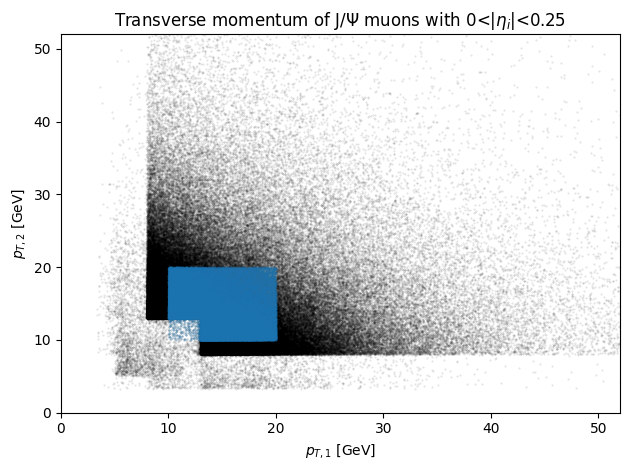

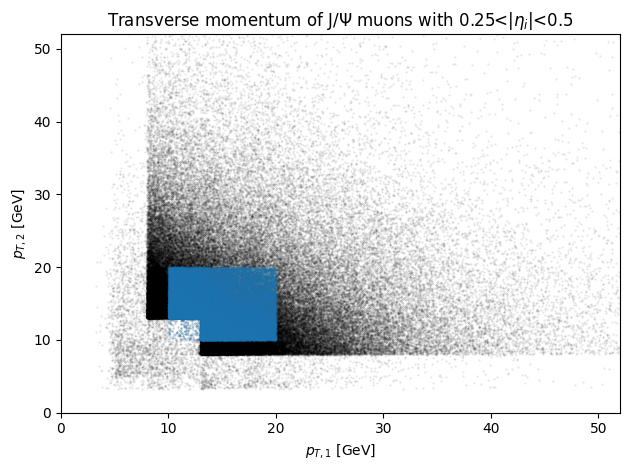

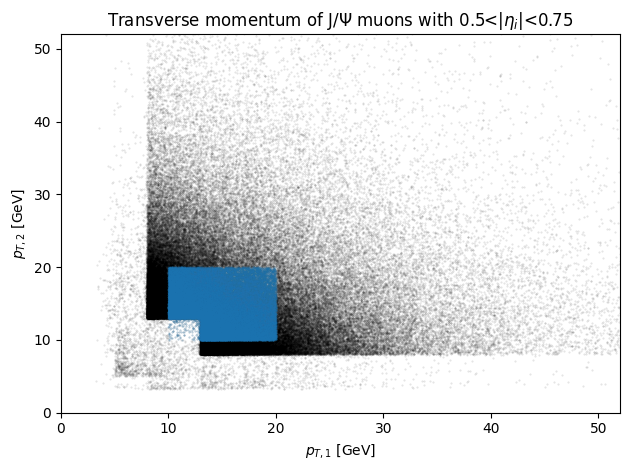

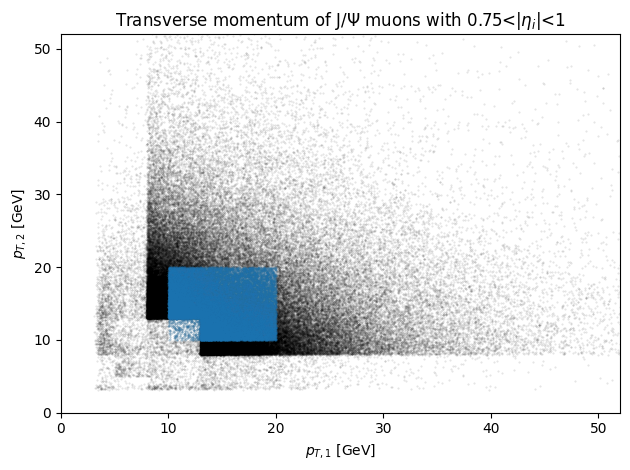

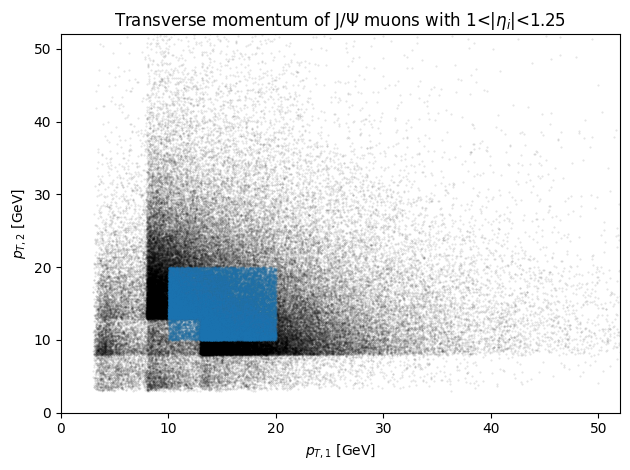

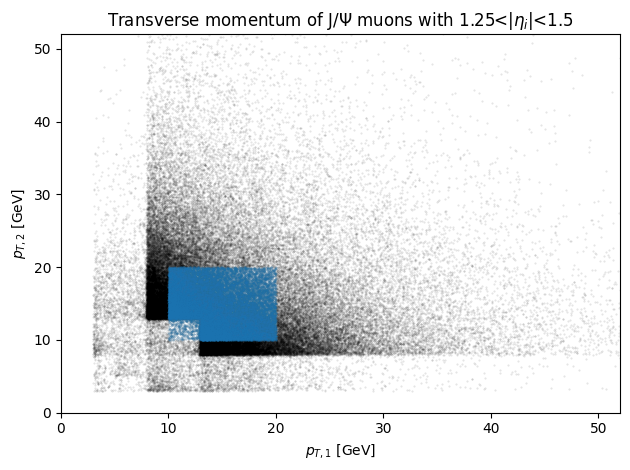

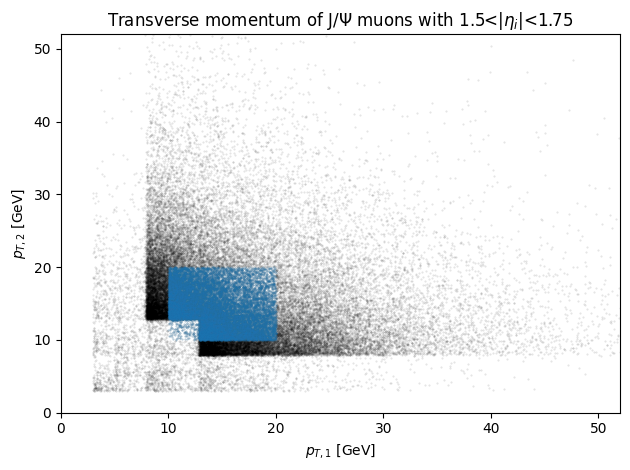

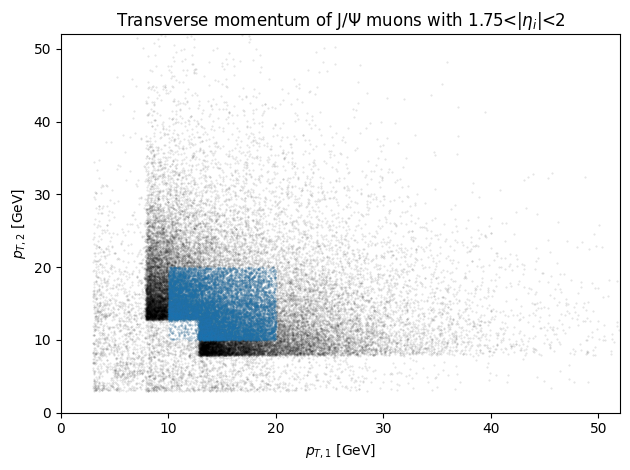

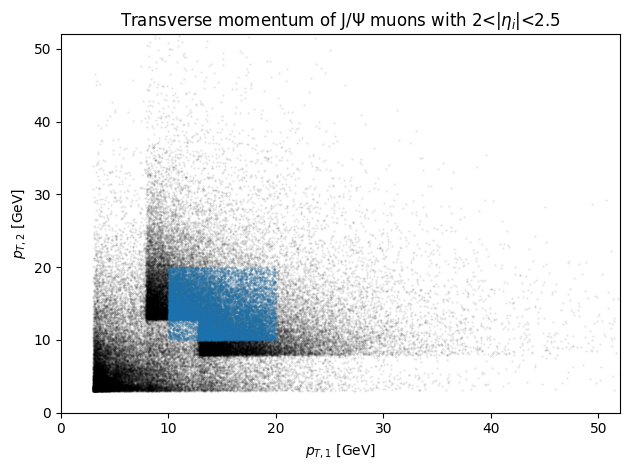

In [10]:
#plot the data for each bin
eta = [0,0.25,0.5,0.75,1,1.25,1.5,1.75,2,2.5] #eta bin boundries

dataBins = [] #contains the pertitioned Data for each eta Bin
fitResults = [] #results of fits to determine k_eta

for i in range(len(eta)-1):
    #create filter for eta
    f1 = (np.abs(jpsi.mu1.eta.to_numpy()) > eta[i]) & (np.abs(jpsi.mu1.eta.to_numpy()) < eta[i+1])
    f2 = (np.abs(jpsi.mu2.eta.to_numpy()) > eta[i]) & (np.abs(jpsi.mu2.eta.to_numpy()) < eta[i+1])
    
    f = f1 & f2
    
    titl = "Transverse momentum of J/Ψ muons with " + str(eta[i])+"<|$\eta_i$|<" + str(eta[i+1])

    #create partition
    xcuts = [10,20,2]
    ycuts = [10,20,2]
    
    areas, subsets = partition(jpsi[f],xcuts,ycuts, title = titl, threshhold = 500)
    
    dataBins.append(subsets)
    
    

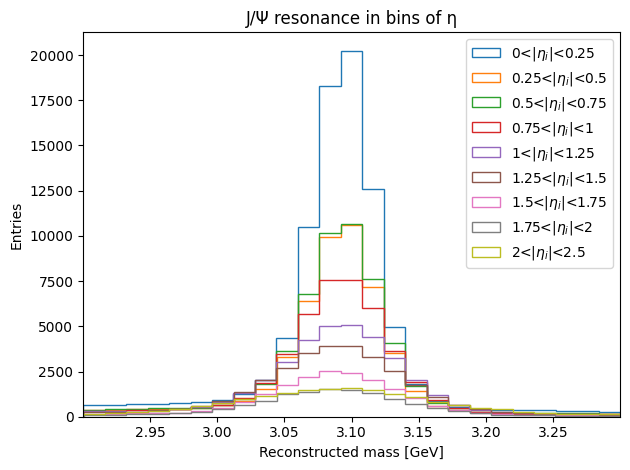

In [11]:
#Plot invariant mass histogram for each bin
for i in range(len(dataBins)):
    plt.hist(dataBins[i]["sub00"].M, label = str(eta[i])+"<|"+"$\eta_i$" + "|<" + str(eta[i+1]), bins = 25, histtype = "step")
    
plt.xlabel("Reconstructed mass [GeV]")
plt.ylabel("Entries")
plt.title("J/Ψ resonance in bins of η")
plt.legend()
plt.show()   

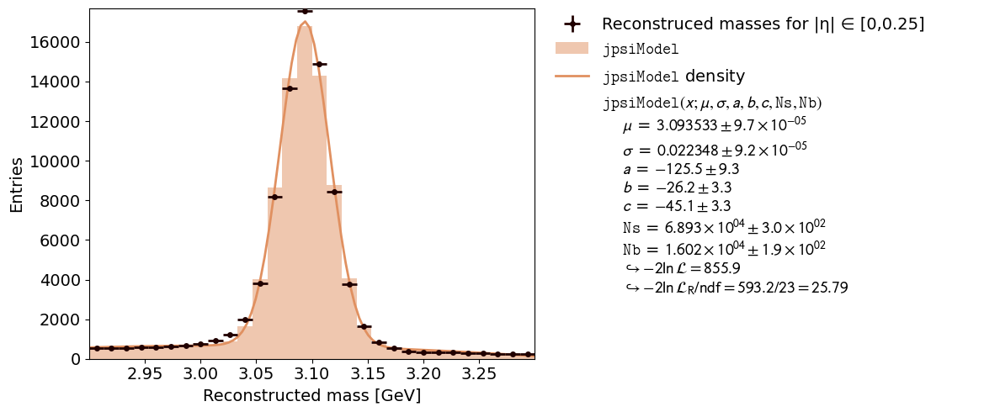

In [12]:
#Fit the smallest eta bin to determine pt Resolution
# for eta in 0-0.25 Bin assume k = 0
#-> dm/m = dp/p

#get data
massData = dataBins[0]["sub00"].M.to_numpy()
minM = np.nanmin(massData)
maxM = np.nanmax(massData)

#set starting parameters
paramDict = {"a" : -80,
             "b" : 100,
             "sigma":0.03,
             "mu": 3,
             "Ns"  : 0.9 * len(massData),
             "Nb" : 0.1 * len(massData)
            }

#set up histogram fit
histogram = kfe.HistContainer(n_bins=30, bin_range=(minM, maxM), fill_data=massData)    
fit = kfe.HistFit(data=histogram, model_function=jpsiModel, density = False)
fit.set_parameter_values(**paramDict)
fit.limit_parameter("sigma",0,0.09) #must be positive
fit.limit_parameter("mu",2,4)
result = fit.do_fit()  # do the fit
fitResults.append(result)

sigma = fit.parameter_values[1] #uncertainty in m
error_sigma = fit.parameter_errors[1]
massResolution = unc.ufloat(sigma,error_sigma) / MJPsi 
ptResolution = massResolution #because k = 0 

plot = kfe.plot(fit, x_label = "Reconstructed mass [GeV]",data_label="Reconstruced masses for |η| ∈ ["+str(eta[0]) + "," + str(eta[1]) +"]" )  

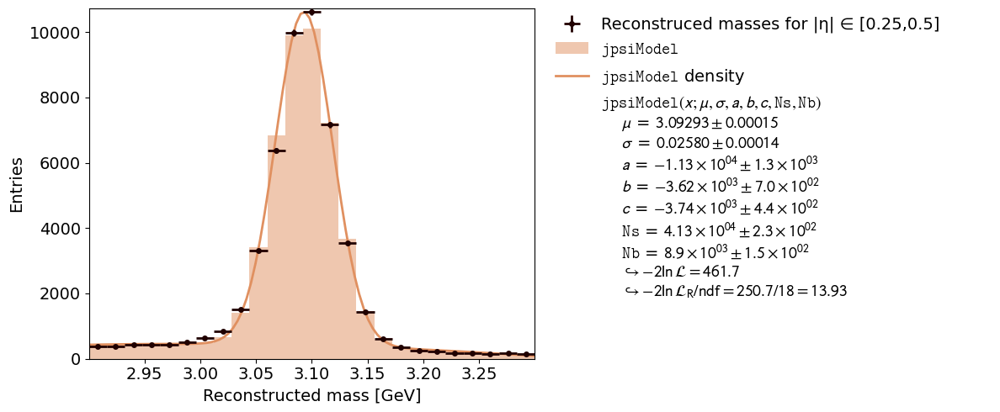

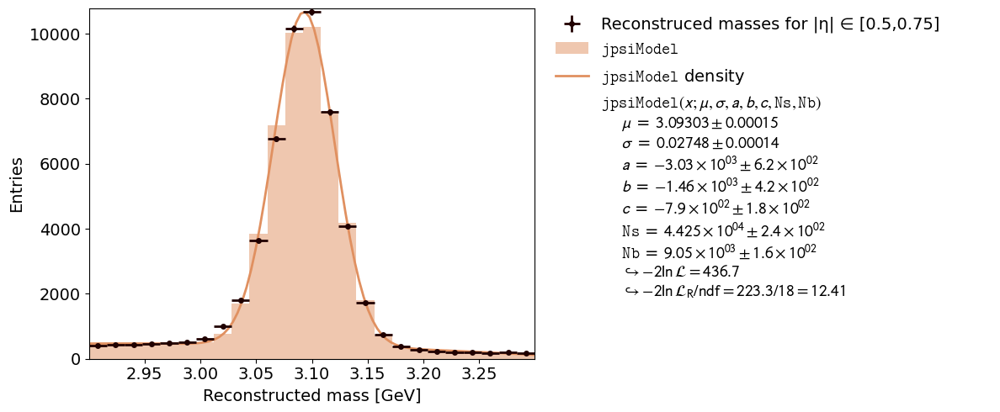

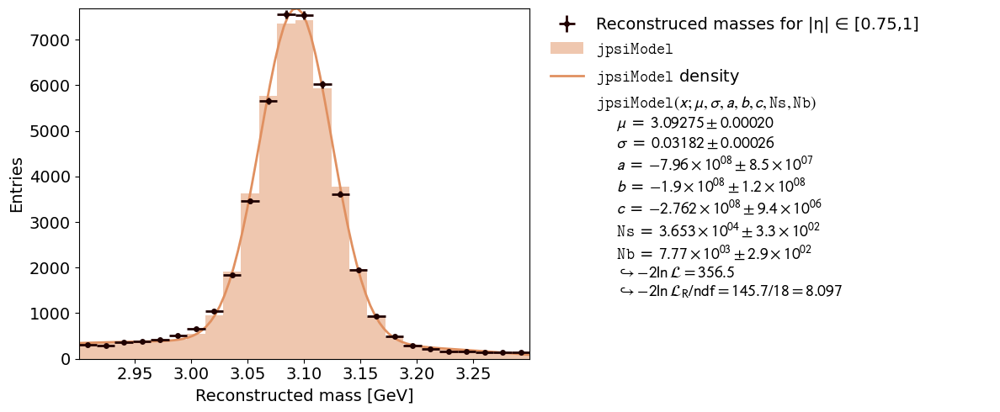

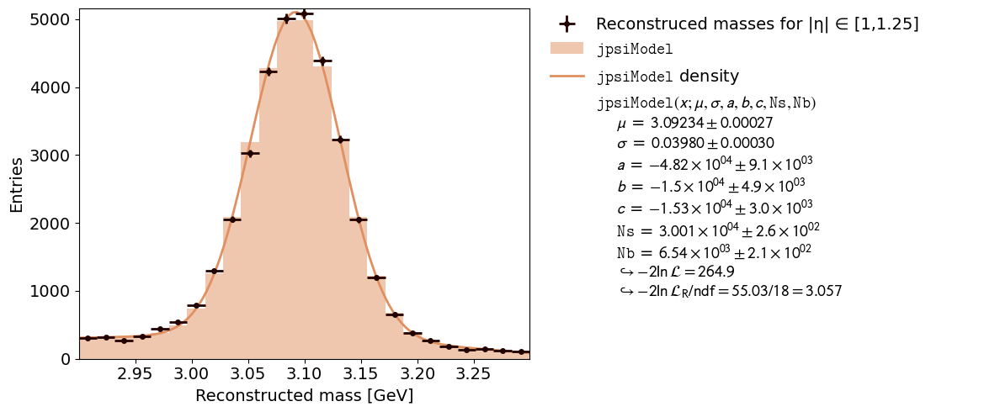

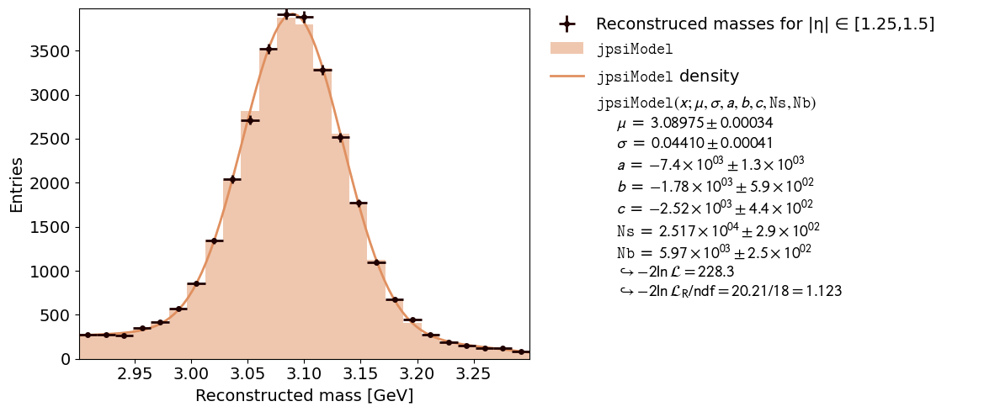

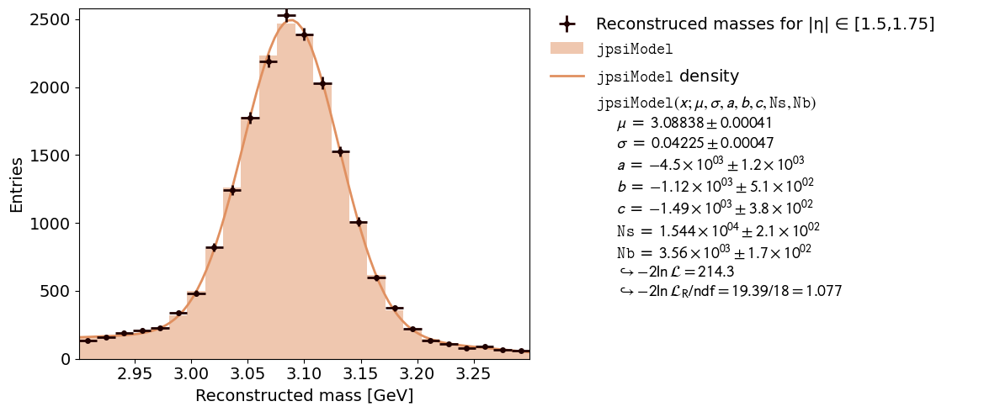

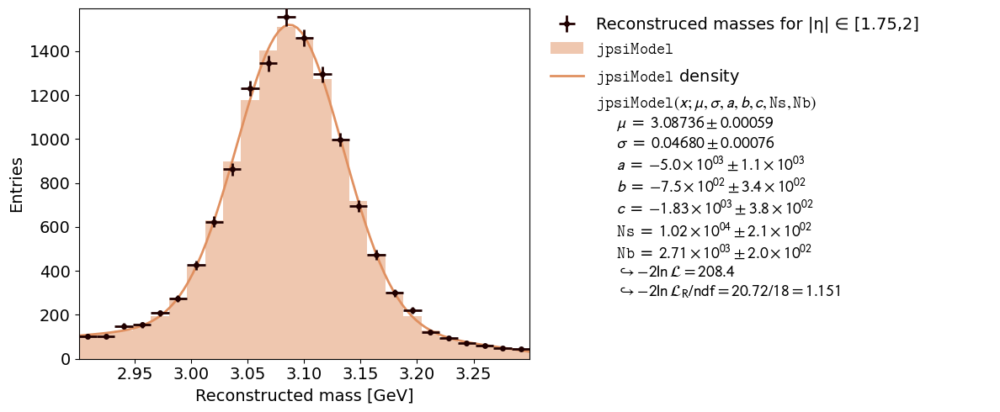

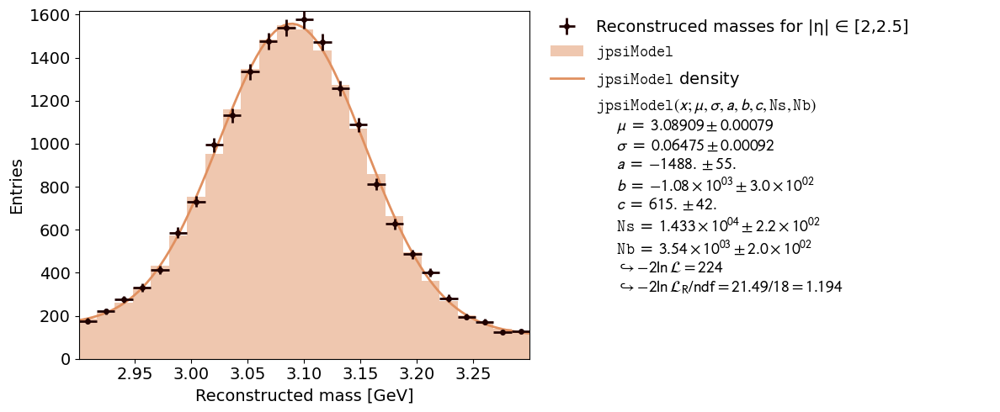

In [13]:
#Calculate k for all other partitions
kList = [0] #save calculated values of k, first is assumed to be zero
error_kList = [0] #same for their uncertainties

for i in range(1,len(dataBins)):
    massData = dataBins[i]["sub00"].M.to_numpy()
    minM = np.nanmin(massData)
    maxM = np.nanmax(massData)
    histogram = kfe.HistContainer(n_bins=25, bin_range=(minM, maxM), fill_data=massData)
    
    paramDict = {"a" : -1000,
                 "b" : -1000,
                 "sigma":0.03,
                 "mu": 3,
                 "Ns"  : 0.99 * len(massData),
                 "Nb" : 0.01 * len(massData)
                }
    
    fit = kfe.HistFit(data=histogram, model_function=jpsiModel, density = False)
    fit.set_parameter_values(**paramDict)
    fit.limit_parameter("sigma",0,0.1) #must be positive
    fit.limit_parameter("mu",2,4)
    fit.limit_parameter("Ns",0,len(massData))
    fit.limit_parameter("Nb",0,len(massData))

    #seperate starting parameters for last fit to ensure convergence
    if i == len(dataBins)-1:
        fit.limit_parameter("sigma",0,0.15) #must be positive
        fit.limit_parameter("mu",2,4)
        fit.limit_parameter("Ns",0.8*len(massData),len(massData))
        fit.limit_parameter("Nb",0,0.3*len(massData))
    
    result = fit.do_fit()  # do the fit
    fitResults.append(result)
    
    sigma = fit.parameter_values[1] #uncertainty in m
    error_sigma = fit.parameter_errors[1]
    massResolution = unc.ufloat(sigma,error_sigma) / MJPsi
    
    kList.append((massResolution**2 - ptResolution**2).n)
    error_kList.append((massResolution**2 - ptResolution**2).s)
    plot = kfe.plot(fit, x_label = "Reconstructed mass [GeV]",data_label="Reconstruced masses for |η| ∈ ["+str(eta[i]) + "," + str(eta[i+1]) +"]" )

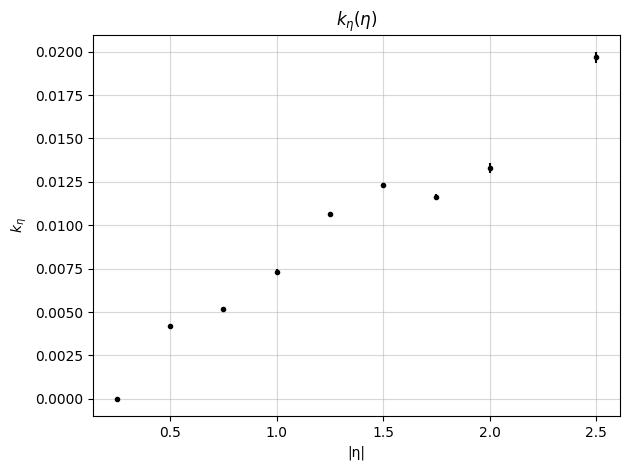

In [14]:
#Plot results for k_eta
k_etaValue = np.sqrt(kList)
#complicated syntax to avoid divide by zero error
k_etaError = np.concatenate(([0],0.5* 1/k_etaValue[1:] * np.array(error_kList)[1:]))

plt.errorbar(eta[1:],k_etaValue,yerr = k_etaError, ls = "none", marker = ".", color = "black")
plt.title("$k_{\eta}(\eta)$")
plt.xlabel("|η|")
plt.grid(alpha = 0.5)
plt.ylabel("$k_{\eta}$")
plt.margins(x=0.05)
plt.show()

<div class="alert alert-warning">
   
## Determining the momentum resolution


</div>

In [15]:
#for extrapolation of dp/p use k of middle bin
k = unc.ufloat(kList[4],error_kList[4]) #select k for eta <= 2.5
print("k = ", k)

k =  0.0001136+/-0.0000026


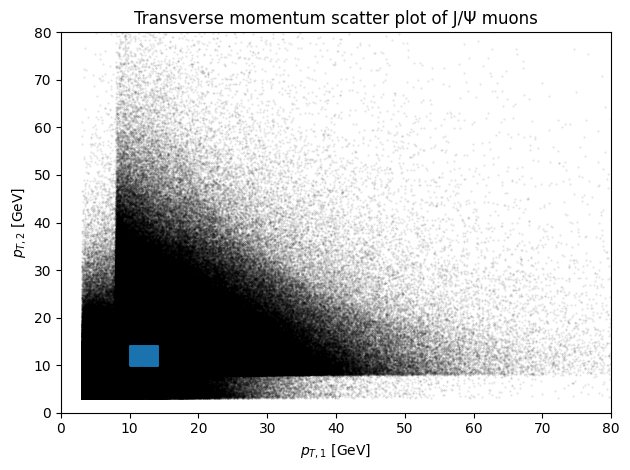

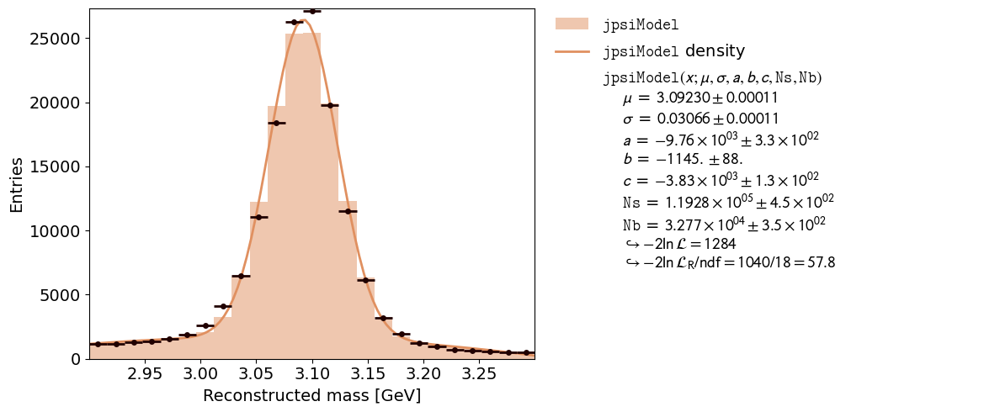

In [16]:
#create calibration partition:
xCutJPsi = np.linspace(10,14,2)
yCutJPsi = np.linspace(10,14,2)

titl = "Transverse momentum scatter plot of J/Ψ muons"
areasJPsi, subsetsJPsi = partition(jpsi,xCutJPsi,yCutJPsi, threshhold = 500, title = titl, xlim = 80, ylim = 80)

#set up fit
massData = subsetsJPsi["sub00","M"].to_numpy()
minM = np.nanmin(massData)
maxM = np.nanmax(massData)

paramDict = {"a" : -1000,
             "b" : -1000,
             "sigma":0.03,
             "mu": 3,
             "Ns"  : 0.99 * len(massData),
             "Nb" : 0.01 * len(massData)
            }

histogram = kfe.HistContainer(n_bins=25, bin_range=(minM, maxM), fill_data=massData)
fit = kfe.HistFit(data=histogram, model_function=jpsiModel, density = False)
fit.set_parameter_values(**paramDict)
fit.limit_parameter("sigma",0,0.5) #must be positive
fit.limit_parameter("mu",2,4)
fit.limit_parameter("Ns",0,len(massData))
fit.limit_parameter("Nb",0,len(massData))

#calculate c
res = fit.do_fit()  # do the fit
massResolution = unc.ufloat(fit.parameter_values[1],fit.parameter_errors[1]) 
c = (massResolution/MJPsi)**2 - k
plot = kfe.plot(fit, x_label = "Reconstructed mass [GeV]" ,data_label= "__del__" )
plot.show()


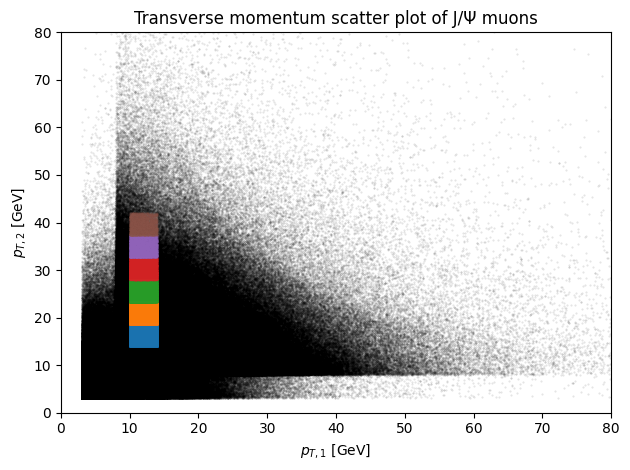

In [17]:
#set up partitions to determine pt2 resolution
xCutJPsi = np.linspace(10,14,2)
yCutJPsi = np.linspace(14,42,7)

titl = "Transverse momentum scatter plot of J/Ψ muons"
areasJPsi_pt2Axis, subsetsJPsi_pt2Axis = partition(jpsi,xCutJPsi,yCutJPsi, threshhold = 500, title = titl, xlim = 80, ylim = 80)
areasJPsi_pt2Axis = np.sort(areasJPsi_pt2Axis)

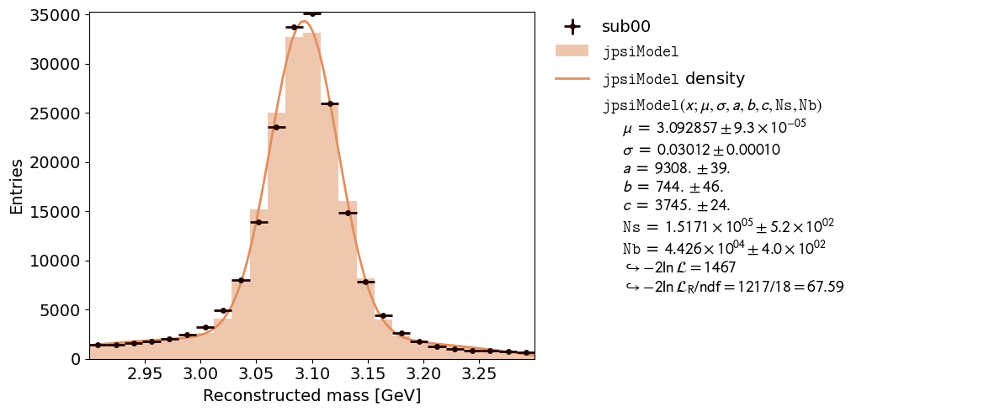

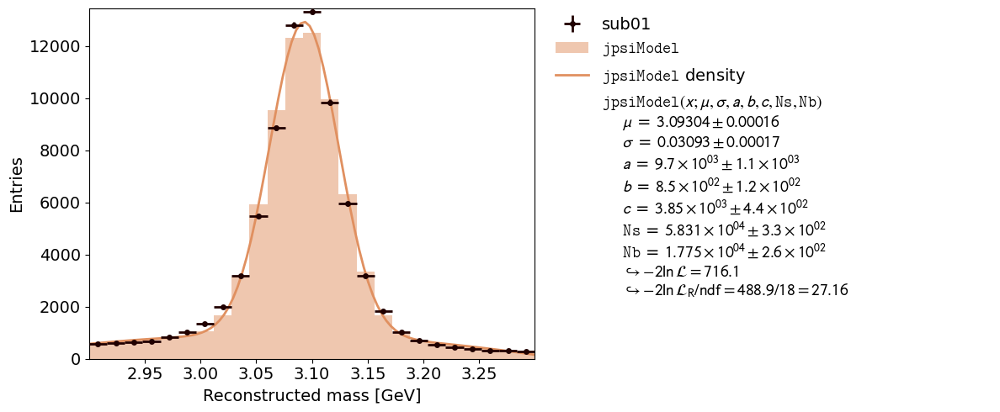

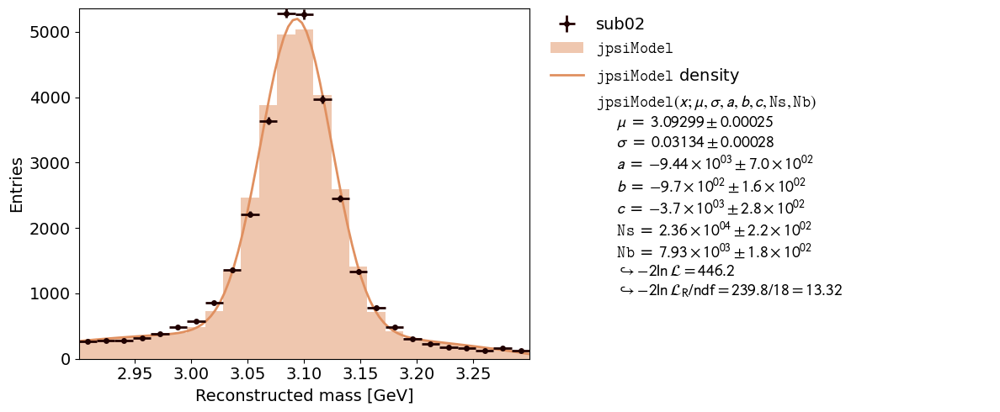

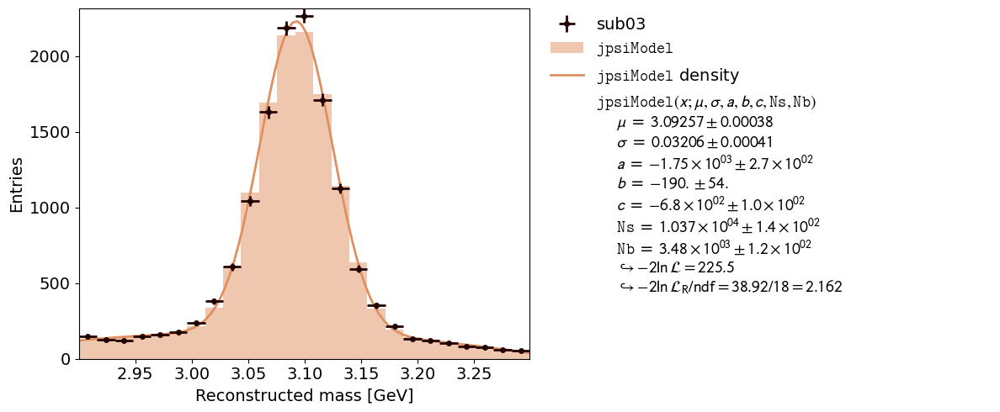

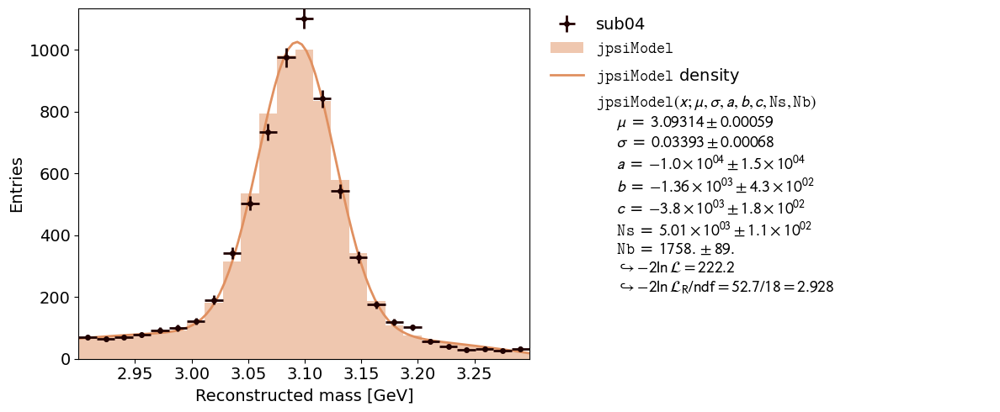

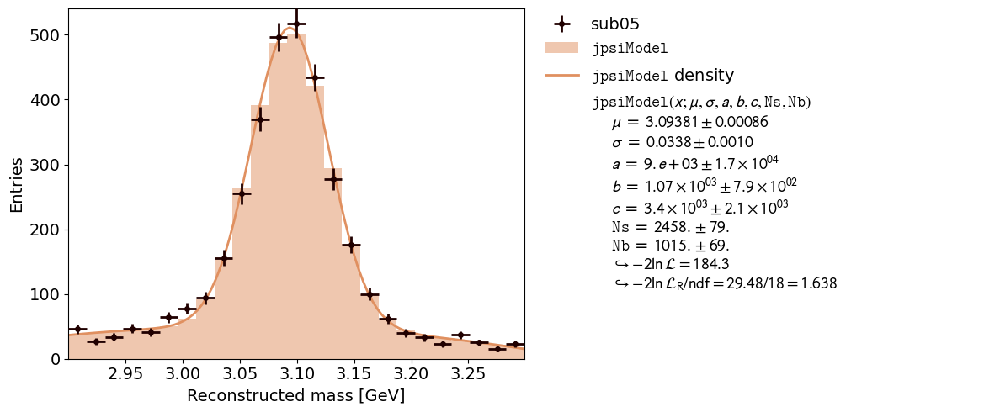

In [18]:
#fit the partitions created above
jpsiMassResolution_pt2Axis = {}      #result of fit (sigma)

#average pt2 of each partition
avgMu2pt_pt2Axis = {} #required to calculate pt2 resolution

fitResults = []

for area in areasJPsi_pt2Axis:
    #prepare Data For Fit
    massData = subsetsJPsi_pt2Axis[area,"M"].to_numpy()
    massData = massData[~(np.isnan(massData))]
    pt1 = subsetsJPsi_pt2Axis[area,"mu1pt"].to_numpy()
    pt1 = pt1[~(np.isnan(pt1))]
    pt2 = subsetsJPsi_pt2Axis[area,"mu2pt"].to_numpy()
    pt2 = pt2[~(np.isnan(pt2))]
    
    minM = np.nanmin(massData)
    maxM = np.nanmax(massData)
    histogram = kfe.HistContainer(n_bins=25, bin_range=(minM, maxM), fill_data=massData)

    paramDict = {"a" : -1000,
                 "b" : -500,
                 "sigma":0.03,
                 "mu": 3,
                 "Ns"  : 0.99 * len(massData),
                 "Nb" : 0.01 * len(massData)
                }
    fit = kfe.HistFit(data=histogram, model_function=jpsiModel, density = False)
    fit.set_parameter_values(**paramDict)
    fit.limit_parameter("sigma",0,0.5) #must be positive
    fit.limit_parameter("mu",2,4)
    fit.limit_parameter("Ns",0,len(massData))
    fit.limit_parameter("Nb",0,len(massData))
    fit.limit_parameter("a",-10000,10000)
    fit.limit_parameter("b",-10000,10000)
    fit.limit_parameter("c",-10000,10000)

    #extract relevant results
    result = fit.do_fit()  # do the fit
    fitResults.append(result)
    sigma = fit.parameter_values[1] #uncertainty in m
    error_sigma = fit.parameter_errors[1]

    #save relevant results for future calculations
    jpsiMassResolution_pt2Axis[area] = unc.ufloat(sigma,error_sigma)
    avgMu2pt_pt2Axis[area] = unc.ufloat(np.average(pt2),np.std(pt2,ddof = 1) / np.sqrt(len(pt2)))
    
    plot = kfe.plot(fit, x_label = "Reconstructed mass [GeV]",data_label=area)
    plot.show()
    

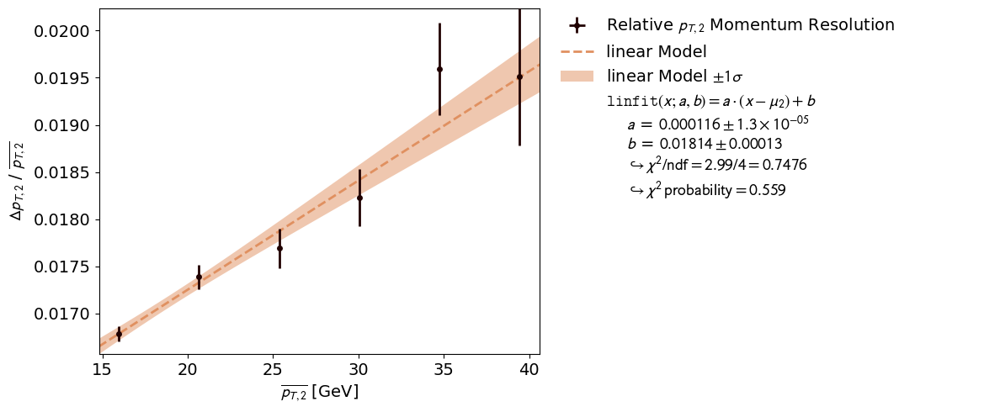

In [19]:
#calculate and then fit pt2 resolution
massResolution = np.array(list(jpsiMassResolution_pt2Axis.values()))

#x coordinates of data points
pt2 = np.array(list(avgMu2pt_pt2Axis.values()))
#y coordinates of data points
pt2Resolution = pt2 * unp.sqrt(4 * (massResolution/MJPsi)**2 - c - k)


#mean of pt2 for parameterising the fit model
muPt2 = np.mean(unp.nominal_values(pt2)) 

def linfit(x,a,b):
    return b+a*(x-muPt2)

#set up fit
fit = kfe.XYFit([unp.nominal_values(pt2),unp.nominal_values(pt2Resolution/pt2)],model_function = linfit)
fit.add_error(axis = "y", err_val = unp.std_devs(pt2Resolution/pt2))
respt2 = fit.do_fit()
plot = kfe.plot(fit, x_label = "$\overline {p_{T,2}}$ [GeV]", y_label = "$\Delta p_{T,2}$ / $\overline {p_{T,2}}$", 
                data_label="Relative $p_{T,2}$ Momentum Resolution",
                model_label= "linear Model",
                model_expression="{a} \cdot ({x} - \mu_2)+{b}")

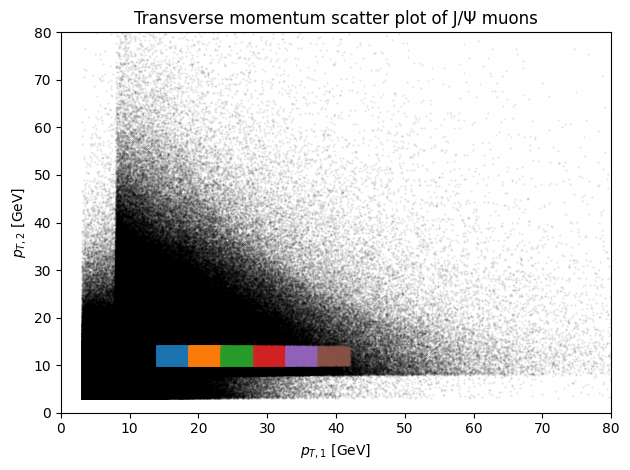

sub00                           sub10                        \
               M      mu1pt      mu2pt         M      mu1pt      mu2pt   
0       3.114447  15.715366  11.412709  2.958228  20.322014  10.869760   
1       3.213899  15.581364  11.613047  3.088489  22.153750  12.008813   
2       3.097392  14.835871  12.481005  3.095852  21.754921  13.395995   
3       3.136447  17.968737  10.756288  2.982368  20.546460  12.170274   
4       3.064555  14.535969  10.362414  3.134868  19.453442  10.502388   
...          ...        ...        ...       ...        ...        ...   
199284  3.116879  14.194510  12.677619       NaN        NaN        NaN   
199285  3.095685  18.605425  12.497852       NaN        NaN        NaN   
199286  3.120489  14.991643  11.097614       NaN        NaN        NaN   
199287  3.124412  14.869146  13.990990       NaN        NaN        NaN   
199288  3.060076  14.189580  11.546965       NaN        NaN        NaN   

           sub20                           sub30                        \
               M      mu1pt      mu2pt         M      mu1pt      mu2pt   
0       3.096429  27.989857  12.342378  3.097962  32.078865  11.345457   
1       3.049506  24.422432  12.090404  3.139115  30.221508  11.170107   
2       3.167668  25.559208  11.004874  3.095581  30.225193  12.436017   
3       3.095419  24.713740  10.695196  3.217360  28.554422  11.999460   
4       3.063819  25.501595  11.189284  3.037814  30.312975  11.253262   
...          ...        ...        ...       ...        ...        ...   
199284       NaN        NaN        NaN       NaN        NaN        NaN   
199285       NaN        NaN        NaN       NaN        NaN        NaN   
199286       NaN        NaN        NaN       NaN        NaN        NaN   
199287       NaN        NaN        NaN       NaN        NaN        NaN   
199288       NaN        NaN        NaN       NaN        NaN        NaN   

           sub40                           sub50                        
               M      mu1pt      mu2pt         M      mu1pt      mu2pt  
0       3.085385  32.908756  12.084881  3.129019  38.003223  10.054844  
1       3.070755  33.309200  11.030837  3.023082  40.230730  13.039345  
2       3.101537  33.321080  13.374799  3.230796  41.719437  10.689563  
3       3.121541  33.571980  10.912059  3.050702  39.850890  13.859978  
4       3.019179  34.726050  11.859133  3.065185  37.671130  11.931746  
...          ...        ...        ...       ...        ...        ...  
199284       NaN        NaN        NaN       NaN        NaN        NaN  
199285       NaN        NaN        NaN       NaN        NaN        NaN  
199286       NaN        NaN        NaN       NaN        NaN        NaN  
199287       NaN        NaN        NaN       NaN        NaN        NaN  
199288       NaN        NaN        NaN       NaN        NaN        NaN  

[199289 rows x 18 columns]

In [20]:
#repeat same process for pt1 resolution
xCutJPsi = np.linspace(14,42,7)
yCutJPsi = np.linspace(10,14,2)

titl = "Transverse momentum scatter plot of J/Ψ muons"
areasJPsi_pt1Axis, subsetsJPsi_pt1Axis = partition(jpsi,xCutJPsi,yCutJPsi, threshhold = 500, title = titl, xlim = 80, ylim = 80)
areasJPsi_pt1Axis = np.sort(areasJPsi_pt1Axis)
subsetsJPsi_pt1Axis

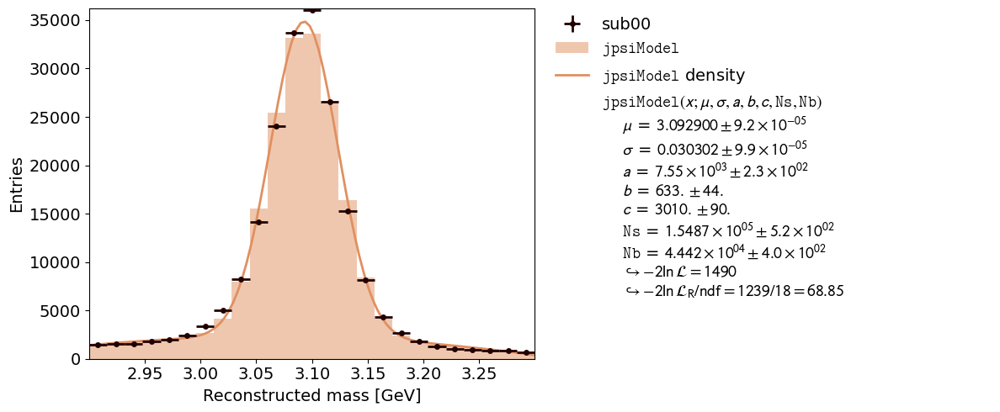

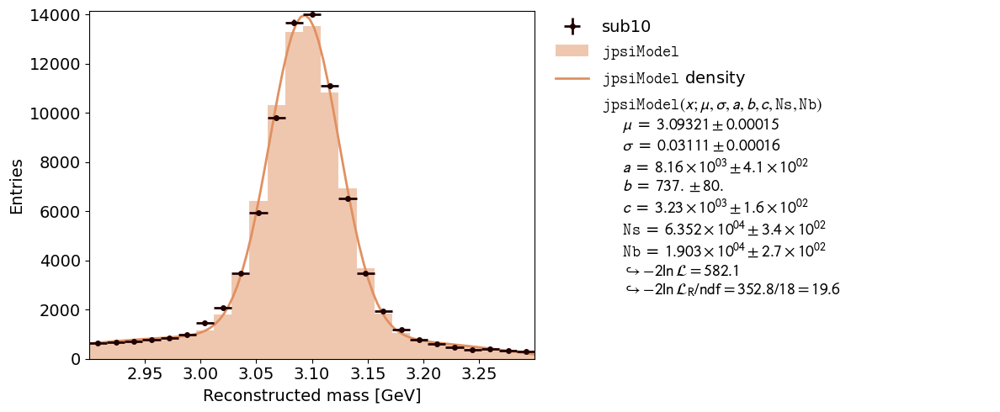

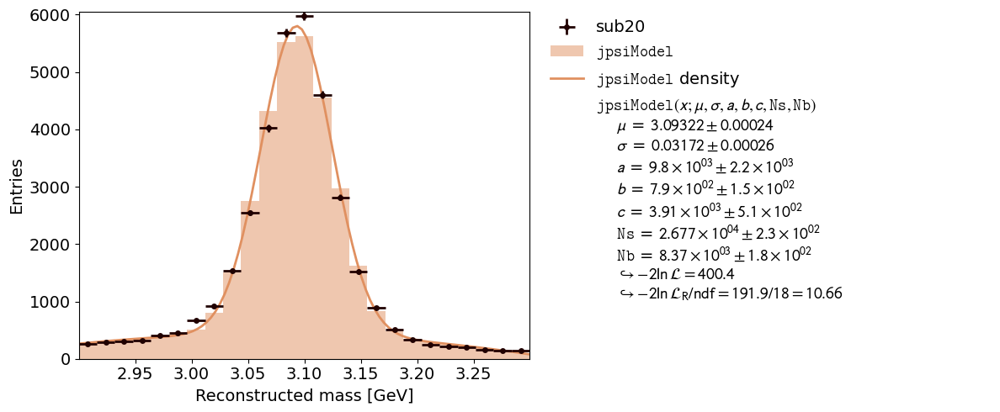

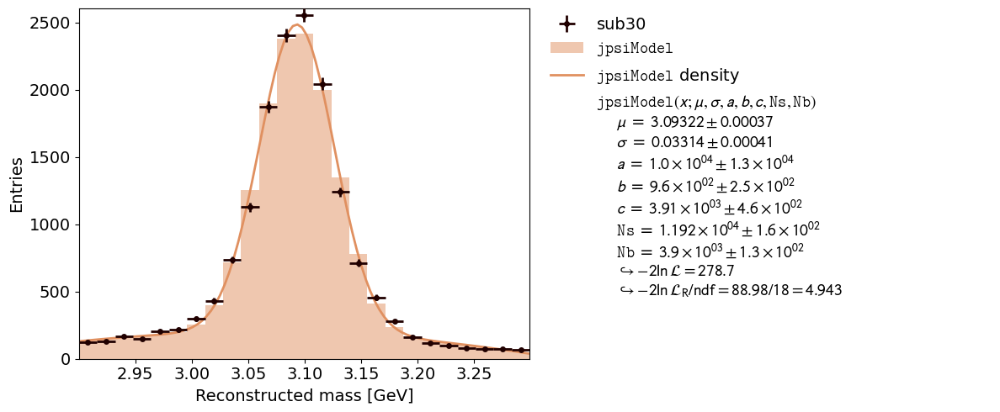

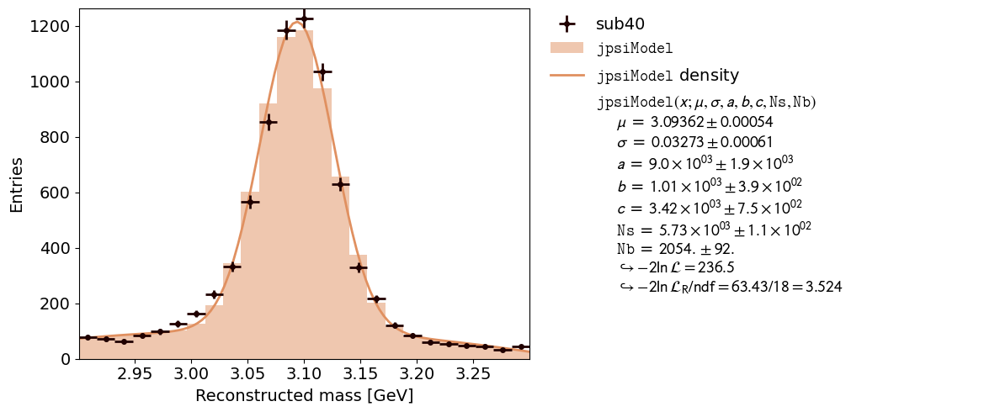

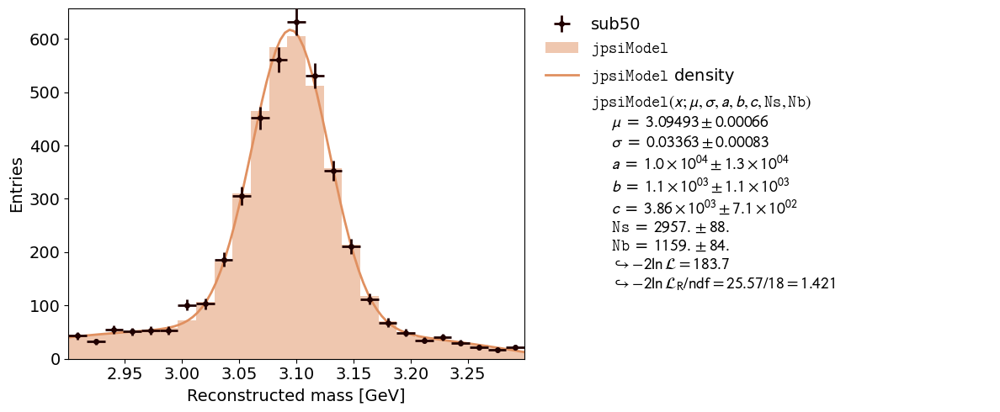

In [21]:
jpsiMassResolution_pt1Axis = {}       #result of fit (sigma)
avgMu1pt_pt1Axis = {} #average pt1 of each partition

fitResults = []

for area in areasJPsi_pt1Axis:
    #prepare Data For Fit
    massData = subsetsJPsi_pt1Axis[area,"M"].to_numpy()
    massData = massData[~(np.isnan(massData))]
    pt1 = subsetsJPsi_pt1Axis[area,"mu1pt"].to_numpy()
    pt1 = pt1[~(np.isnan(pt1))]
    pt2 = subsetsJPsi_pt1Axis[area,"mu2pt"].to_numpy()
    pt2 = pt2[~(np.isnan(pt2))]
    
    minM = np.nanmin(massData)
    maxM = np.nanmax(massData)
    histogram = kfe.HistContainer(n_bins=25, bin_range=(minM, maxM), fill_data=massData)
    
    paramDict = {"a" : -1000,
                 "b" : -100,
                 "c" : -1000,
                 "sigma":0.03,
                 "mu": 3,
                 "Ns"  : 0.99 * len(massData),
                 "Nb" : 0.01 * len(massData)
                }
    fit = kfe.HistFit(data=histogram, model_function=jpsiModel, density = False)
    fit.set_parameter_values(**paramDict)
    fit.limit_parameter("sigma",0,0.5) #must be positive
    fit.limit_parameter("mu",2,4)
    fit.limit_parameter("Ns",0,len(massData))
    fit.limit_parameter("Nb",0,len(massData))
    fit.limit_parameter("a",-10000,10000)
    fit.limit_parameter("b",-10000,10000)
    fit.limit_parameter("c",-10000,10000)
    
    result = fit.do_fit()  # do the fit
    fitResults.append(result)
    sigma = fit.parameter_values[1] #uncertainty in m
    error_sigma = fit.parameter_errors[1]
    
    jpsiMassResolution_pt1Axis[area] = unc.ufloat(sigma,error_sigma)
    
    avgMu1pt_pt1Axis[area] = unc.ufloat(np.average(pt1),np.std(pt1,ddof = 1) / np.sqrt(len(pt1)))
    
    plot = kfe.plot(fit, x_label = "Reconstructed mass [GeV]",data_label=area)
    plot.show()
    

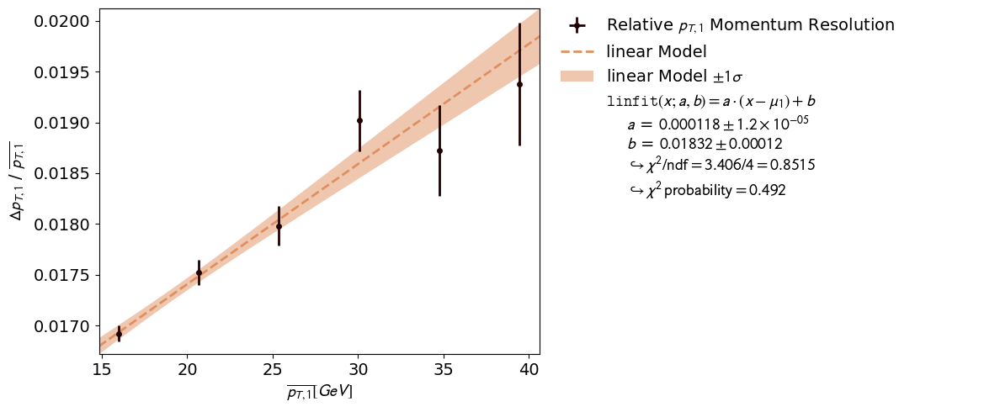

In [22]:
#calculate and then fit pt1 resolution
massResolution = np.array(list(jpsiMassResolution_pt1Axis.values()))
pt1 = np.array(list(avgMu1pt_pt1Axis.values()))
pt1Resolution = pt1 * unp.sqrt(4 * (massResolution/MJPsi)**2 - c-k)

muPt1 = np.mean(unp.nominal_values(pt1))

def linfit(x,a,b):
    return b+a*(x-muPt1)

fit = kfe.XYFit([unp.nominal_values(pt1),unp.nominal_values(pt1Resolution/pt1)],model_function = linfit)
fit.add_error(axis = "y", err_val = unp.std_devs(pt1Resolution/pt1))
respt1 = fit.do_fit()
plot = kfe.plot(fit, x_label = "$\overline {p_{T,1}}  [GeV]$", y_label = "$\Delta p_{T,1}$ / $\overline {p_{T,1}}$", 
                data_label="Relative $p_{T,1}$ Momentum Resolution",
                model_label= "linear Model",
                model_expression="{a} \cdot ({x} - \mu_1)+{b}")

In [23]:
#get results of fittet parameters
apt1 = respt1["parameter_values"]["a"]
bpt1 = respt1["parameter_values"]["b"]
apt2 = respt2["parameter_values"]["a"]
bpt2 = respt2["parameter_values"]["b"]

#calculate relative resolution  \Delta pt1 / pt1 and \Delta pt2 / pt2  based on extrapolations above
def pt1Res(pt1):
    return bpt1 + apt1 * (pt1-muPt1)

def pt2Res(pt2):
    return bpt2 + apt2 * (pt2-muPt2)


<div class="alert alert-warning">
   
## Filtering the Z resonance

</div>

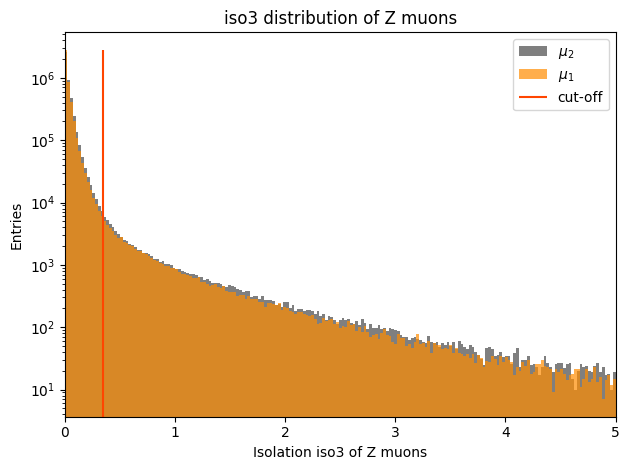

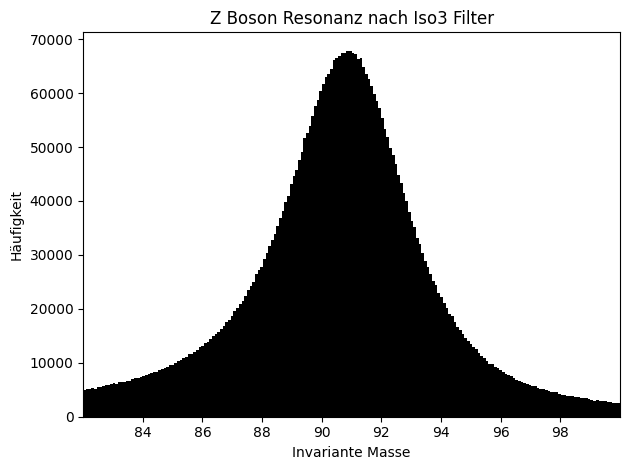

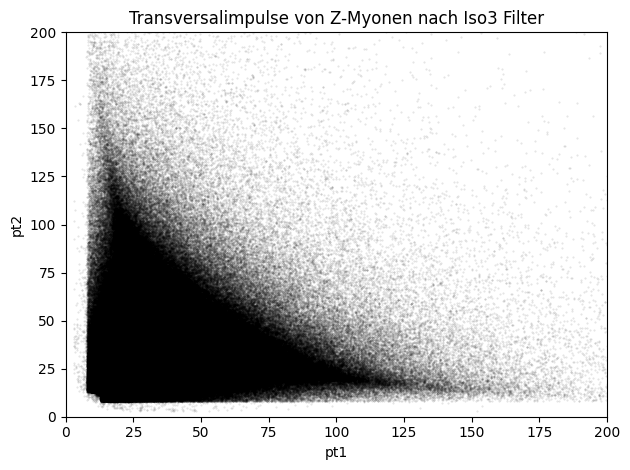

Efficiency of iso3 Filter: 97.28663360121213


In [24]:
#set iso3 filter boundarys
minIso = 0
maxIso = 0.35

#get Z dataset
zboson = data[(data.M > zbosonStart)  & (data.M < zbosonEnd)]

#create Iso Filter
iso3FilterMu1 = (zboson.mu1.Iso3 >= minIso) & (zboson.mu1.Iso3 < maxIso)
iso3FilterMu2 = (zboson.mu2.Iso3 >= minIso) & (zboson.mu2.Iso3 < maxIso)
iso3Filter  = (iso3FilterMu1 & iso3FilterMu2)

#plot iso3 distributions of mu1 and mu2
iso3mu2 = zboson.mu2.Iso3.to_numpy()
counts,bins,patches = plt.hist(iso3mu2,bins = np.linspace(0,5,200), color = "black",label = "$\mu_2$", alpha = 0.5)

iso3mu1 = zboson.mu1.Iso3.to_numpy()
counts,bins,patches = plt.hist(iso3mu1,bins = np.linspace(0,5,200), color = "darkorange",label = "$\mu_1$", alpha = 0.7)

#plot cut-off
maxHeight = np.max(counts)
plt.vlines(maxIso,0,maxHeight,colors = "orangered", label = "cut-off")

plt.title("iso3 distribution of Z muons")
plt.yscale("log")
plt.legend()
plt.ylabel("Entries")
plt.xlabel("Isolation iso3 of Z muons")
plt.show()

#plot resonance after iso3 filter
plt.hist(zboson[iso3Filter].M, bins = 200, color = "black")
plt.title("Z Boson Resonanz nach Iso3 Filter")
plt.xlabel("Invariante Masse")
plt.ylabel("Häufigkeit")
plt.show()

#plot pt scatterplot after iso3 filter
pt1 = zboson[iso3Filter].mu1.pt
pt2 = zboson[iso3Filter].mu2.pt
plt.xlim(0,200)
plt.ylim(0,200)
plt.title("Transversalimpulse von Z-Myonen nach Iso3 Filter")
plt.xlabel("pt1")
plt.ylabel("pt2")
plt.scatter(pt1,pt2, marker = ".", color = "black", alpha = 0.1, linewidth = 0, s=10)
plt.show()

#calculate efficiency of filter
N = len(zboson.M.to_numpy())
n = len(zboson[iso3Filter].M.to_numpy())

print("Efficiency of iso3 Filter:",n/N * 100)

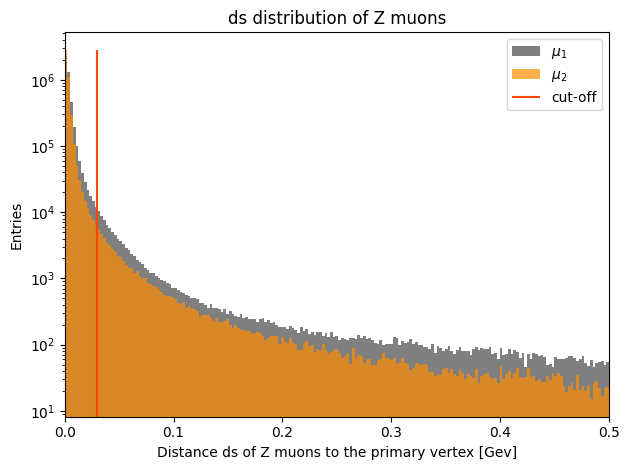

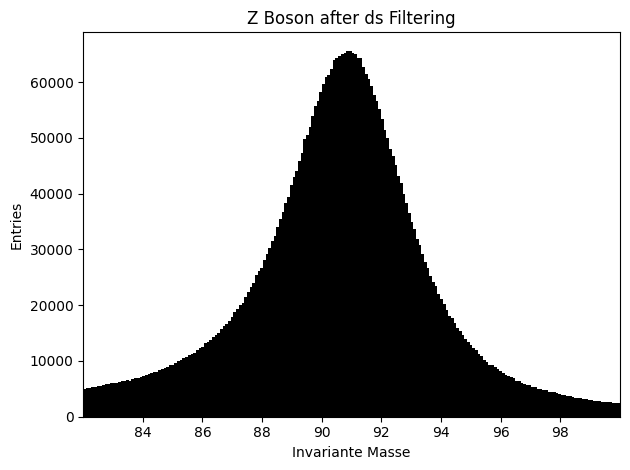

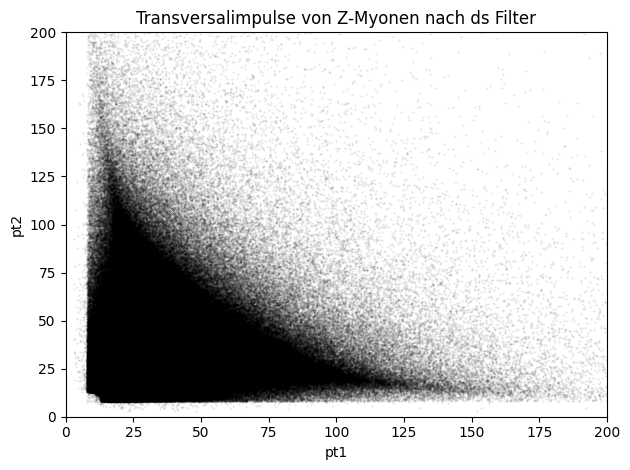

Efficiency of ds Filter: 93.70927196610837


In [25]:
#set ds filter boundarys
minds = 0
maxds = 0.03

zboson = data[(data.M > zbosonStart)  & (data.M < zbosonEnd)]

#set up filter
dsFilterMu1 = (zboson.mu1.ds >= minds) & (zboson.mu1.ds < maxds)
dsFilterMu2 = (zboson.mu2.ds >= minds) & (zboson.mu2.ds < maxds)
dsFilter  = (dsFilterMu1 & dsFilterMu2)

#plot ds distribution for mu1 and mu2
mu1ds = zboson["mu1","ds"]
counts,bins,patches = plt.hist(mu1ds, bins = np.linspace(0,0.5,200), color = "black",label = "$\mu_1$", alpha = 0.5)
mu2ds = zboson["mu2","ds"]
counts,bins,patches = plt.hist(mu2ds, bins = np.linspace(0,0.5,200), color = "darkorange",label = "$\mu_2$", alpha = 0.7)

maxHeight = np.max(counts)
plt.vlines(maxds,0,maxHeight,colors = "orangered", label = "cut-off")
plt.yscale("log")
plt.title("ds distribution of Z muons")
plt.ylabel("Entries")
plt.xlabel("Distance ds of Z muons to the primary vertex [Gev]")
plt.yscale("log")
plt.legend()
plt.show()

#plot Z resonance after ds filter
plt.hist(zboson[dsFilter].M, bins = 200, color = "black")
plt.title("Z Boson after ds Filtering")
plt.xlabel("Invariante Masse")
plt.ylabel("Entries")
plt.show()

#plot pt scatterplot after ds filter
pt1 = zboson[dsFilter].mu1.pt
pt2 = zboson[dsFilter].mu2.pt
plt.xlim(0,200)
plt.ylim(0,200)
plt.title("Transversalimpulse von Z-Myonen nach ds Filter")
plt.xlabel("pt1")
plt.ylabel("pt2")
plt.scatter(pt1,pt2, marker = ".", color = "black", alpha = 0.1, linewidth = 0, s=10)
plt.show()

#calculate efficiency of ds filter
N = len(zboson.M.to_numpy())
n = len(zboson[dsFilter].M.to_numpy())

print("Efficiency of ds Filter:",n/N * 100)

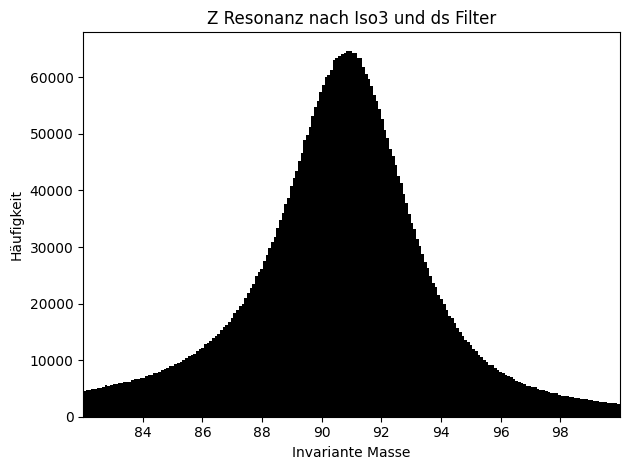

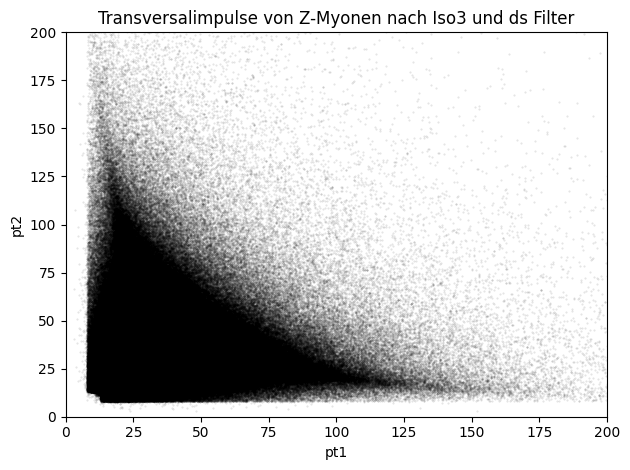

Efficiency of total Filter: 91.84492873616715


In [26]:
# apply both Filters and plot results
Filter = (iso3Filter & dsFilter)

plt.hist(zboson[Filter].M, bins = 200, color = "black")
plt.title("Z Resonanz nach Iso3 und ds Filter")
plt.xlabel("Invariante Masse")
plt.ylabel("Häufigkeit")
plt.show()

pt1 = zboson[Filter].mu1.pt
pt2 = zboson[Filter].mu2.pt
plt.xlim(0,200)
plt.ylim(0,200)
plt.title("Transversalimpulse von Z-Myonen nach Iso3 und ds Filter")
plt.xlabel("pt1")
plt.ylabel("pt2")
plt.scatter(pt1,pt2, marker = ".", color = "black", alpha = 0.1, linewidth = 0, s=10)
plt.show()


N = len(zboson.M.to_numpy())
n = len(zboson[Filter].M.to_numpy())


print("Efficiency of total Filter:",n/N * 100)

In [27]:
# apply both filters to the dataset to be used for further analysis
zboson = zboson[Filter]
print(len(zboson.M.to_numpy()))

4294093


In [28]:
#calculate mass of Z for future Calculations
massZ = np.mean(zboson.M)
error_massZ = np.std(zboson.M,ddof = 1) / np.sqrt(len(zboson.M))
MZ = unc.ufloat(massZ,error_massZ)
print(MZ)

90.6125+/-0.0015


In [29]:
#calculate Mass Resolution at the Z based on the extrapolated momentum resolutions
def getmassResolutionZ(pt1,pt2,k):
    return MZ/2 * unp.sqrt(pt1Res(pt1)**2 + pt2Res(pt2)**2 + k)

<div class="alert alert-warning">
   
### Analyzing the Z boson
</div>

In [30]:
#defining seperate model functions for each partition as required by kafe2

#set start end enpoints of Z dataset
x0 = zbosonStart
x1 = zbosonEnd
#mean of Z resonance for model parametrization
m = np.mean(zboson.M.to_numpy())

def zModel0_sub00(x,sigma0_sub00,Gamma,mu,a0_sub00,b0_sub00,Ns0_sub00,Nb0_sub00):
    voigtprofile = Ns0_sub00 * voigt(x-mu,sigma0_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a0_sub00*(2*m-x1-x0)-2*b0_sub00)
    back = Nb0_sub00/normConst * (a0_sub00*(x-m)+b0_sub00)
    return voigtprofile + back
def zModel0_sub01(x,sigma0_sub01,Gamma,mu,a0_sub01,b0_sub01,Ns0_sub01,Nb0_sub01):
    voigtprofile = Ns0_sub01 * voigt(x-mu,sigma0_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a0_sub01*(2*m-x1-x0)-2*b0_sub01)
    back = Nb0_sub01/normConst * (a0_sub01*(x-m)+b0_sub01)
    return voigtprofile + back
def zModel0_sub10(x,sigma0_sub10,Gamma,mu,a0_sub10,b0_sub10,Ns0_sub10,Nb0_sub10):
    voigtprofile = Ns0_sub10 * voigt(x-mu,sigma0_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a0_sub10*(2*m-x1-x0)-2*b0_sub10)
    back = Nb0_sub10/normConst * (a0_sub10*(x-m)+b0_sub10)
    return voigtprofile + back
def zModel0_sub11(x,sigma0_sub11,Gamma,mu,a0_sub11,b0_sub11,Ns0_sub11,Nb0_sub11):
    voigtprofile = Ns0_sub11 * voigt(x-mu,sigma0_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a0_sub11*(2*m-x1-x0)-2*b0_sub11)
    back = Nb0_sub11/normConst * (a0_sub11*(x-m)+b0_sub11)
    return voigtprofile + back
def zModel1_sub00(x,sigma1_sub00,Gamma,mu,a1_sub00,b1_sub00,Ns1_sub00,Nb1_sub00):
    voigtprofile = Ns1_sub00 * voigt(x-mu,sigma1_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a1_sub00*(2*m-x1-x0)-2*b1_sub00)
    back = Nb1_sub00/normConst * (a1_sub00*(x-m)+b1_sub00)
    return voigtprofile + back
def zModel1_sub01(x,sigma1_sub01,Gamma,mu,a1_sub01,b1_sub01,Ns1_sub01,Nb1_sub01):
    voigtprofile = Ns1_sub01 * voigt(x-mu,sigma1_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a1_sub01*(2*m-x1-x0)-2*b1_sub01)
    back = Nb1_sub01/normConst * (a1_sub01*(x-m)+b1_sub01)
    return voigtprofile + back
def zModel1_sub10(x,sigma1_sub10,Gamma,mu,a1_sub10,b1_sub10,Ns1_sub10,Nb1_sub10):
    voigtprofile = Ns1_sub10 * voigt(x-mu,sigma1_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a1_sub10*(2*m-x1-x0)-2*b1_sub10)
    back = Nb1_sub10/normConst * (a1_sub10*(x-m)+b1_sub10)
    return voigtprofile + back
def zModel1_sub11(x,sigma1_sub11,Gamma,mu,a1_sub11,b1_sub11,Ns1_sub11,Nb1_sub11):
    voigtprofile = Ns1_sub11 * voigt(x-mu,sigma1_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a1_sub11*(2*m-x1-x0)-2*b1_sub11)
    back = Nb1_sub11/normConst * (a1_sub11*(x-m)+b1_sub11)
    return voigtprofile + back
def zModel2_sub00(x,sigma2_sub00,Gamma,mu,a2_sub00,b2_sub00,Ns2_sub00,Nb2_sub00):
    voigtprofile = Ns2_sub00 * voigt(x-mu,sigma2_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a2_sub00*(2*m-x1-x0)-2*b2_sub00)
    back = Nb2_sub00/normConst * (a2_sub00*(x-m)+b2_sub00)
    return voigtprofile + back
def zModel2_sub01(x,sigma2_sub01,Gamma,mu,a2_sub01,b2_sub01,Ns2_sub01,Nb2_sub01):
    voigtprofile = Ns2_sub01 * voigt(x-mu,sigma2_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a2_sub01*(2*m-x1-x0)-2*b2_sub01)
    back = Nb2_sub01/normConst * (a2_sub01*(x-m)+b2_sub01)
    return voigtprofile + back
def zModel2_sub10(x,sigma2_sub10,Gamma,mu,a2_sub10,b2_sub10,Ns2_sub10,Nb2_sub10):
    voigtprofile = Ns2_sub10 * voigt(x-mu,sigma2_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a2_sub10*(2*m-x1-x0)-2*b2_sub10)
    back = Nb2_sub10/normConst * (a2_sub10*(x-m)+b2_sub10)
    return voigtprofile + back
def zModel2_sub11(x,sigma2_sub11,Gamma,mu,a2_sub11,b2_sub11,Ns2_sub11,Nb2_sub11):
    voigtprofile = Ns2_sub11 * voigt(x-mu,sigma2_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a2_sub11*(2*m-x1-x0)-2*b2_sub11)
    back = Nb2_sub11/normConst * (a2_sub11*(x-m)+b2_sub11)
    return voigtprofile + back
def zModel3_sub00(x,sigma3_sub00,Gamma,mu,a3_sub00,b3_sub00,Ns3_sub00,Nb3_sub00):
    voigtprofile = Ns3_sub00 * voigt(x-mu,sigma3_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a3_sub00*(2*m-x1-x0)-2*b3_sub00)
    back = Nb3_sub00/normConst * (a3_sub00*(x-m)+b3_sub00)
    return voigtprofile + back
def zModel3_sub01(x,sigma3_sub01,Gamma,mu,a3_sub01,b3_sub01,Ns3_sub01,Nb3_sub01):
    voigtprofile = Ns3_sub01 * voigt(x-mu,sigma3_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a3_sub01*(2*m-x1-x0)-2*b3_sub01)
    back = Nb3_sub01/normConst * (a3_sub01*(x-m)+b3_sub01)
    return voigtprofile + back
def zModel3_sub10(x,sigma3_sub10,Gamma,mu,a3_sub10,b3_sub10,Ns3_sub10,Nb3_sub10):
    voigtprofile = Ns3_sub10 * voigt(x-mu,sigma3_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a3_sub10*(2*m-x1-x0)-2*b3_sub10)
    back = Nb3_sub10/normConst * (a3_sub10*(x-m)+b3_sub10)
    return voigtprofile + back
def zModel3_sub11(x,sigma3_sub11,Gamma,mu,a3_sub11,b3_sub11,Ns3_sub11,Nb3_sub11):
    voigtprofile = Ns3_sub11 * voigt(x-mu,sigma3_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a3_sub11*(2*m-x1-x0)-2*b3_sub11)
    back = Nb3_sub11/normConst * (a3_sub11*(x-m)+b3_sub11)
    return voigtprofile + back
def zModel4_sub00(x,sigma4_sub00,Gamma,mu,a4_sub00,b4_sub00,Ns4_sub00,Nb4_sub00):
    voigtprofile = Ns4_sub00 * voigt(x-mu,sigma4_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a4_sub00*(2*m-x1-x0)-2*b4_sub00)
    back = Nb4_sub00/normConst * (a4_sub00*(x-m)+b4_sub00)
    return voigtprofile + back
def zModel4_sub01(x,sigma4_sub01,Gamma,mu,a4_sub01,b4_sub01,Ns4_sub01,Nb4_sub01):
    voigtprofile = Ns4_sub01 * voigt(x-mu,sigma4_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a4_sub01*(2*m-x1-x0)-2*b4_sub01)
    back = Nb4_sub01/normConst * (a4_sub01*(x-m)+b4_sub01)
    return voigtprofile + back
def zModel4_sub10(x,sigma4_sub10,Gamma,mu,a4_sub10,b4_sub10,Ns4_sub10,Nb4_sub10):
    voigtprofile = Ns4_sub10 * voigt(x-mu,sigma4_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a4_sub10*(2*m-x1-x0)-2*b4_sub10)
    back = Nb4_sub10/normConst * (a4_sub10*(x-m)+b4_sub10)
    return voigtprofile + back
def zModel4_sub11(x,sigma4_sub11,Gamma,mu,a4_sub11,b4_sub11,Ns4_sub11,Nb4_sub11):
    voigtprofile = Ns4_sub11 * voigt(x-mu,sigma4_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a4_sub11*(2*m-x1-x0)-2*b4_sub11)
    back = Nb4_sub11/normConst * (a4_sub11*(x-m)+b4_sub11)
    return voigtprofile + back
def zModel5_sub00(x,sigma5_sub00,Gamma,mu,a5_sub00,b5_sub00,Ns5_sub00,Nb5_sub00):
    voigtprofile = Ns5_sub00 * voigt(x-mu,sigma5_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a5_sub00*(2*m-x1-x0)-2*b5_sub00)
    back = Nb5_sub00/normConst * (a5_sub00*(x-m)+b5_sub00)
    return voigtprofile + back
def zModel5_sub01(x,sigma5_sub01,Gamma,mu,a5_sub01,b5_sub01,Ns5_sub01,Nb5_sub01):
    voigtprofile = Ns5_sub01 * voigt(x-mu,sigma5_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a5_sub01*(2*m-x1-x0)-2*b5_sub01)
    back = Nb5_sub01/normConst * (a5_sub01*(x-m)+b5_sub01)
    return voigtprofile + back
def zModel5_sub10(x,sigma5_sub10,Gamma,mu,a5_sub10,b5_sub10,Ns5_sub10,Nb5_sub10):
    voigtprofile = Ns5_sub10 * voigt(x-mu,sigma5_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a5_sub10*(2*m-x1-x0)-2*b5_sub10)
    back = Nb5_sub10/normConst * (a5_sub10*(x-m)+b5_sub10)
    return voigtprofile + back
def zModel5_sub11(x,sigma5_sub11,Gamma,mu,a5_sub11,b5_sub11,Ns5_sub11,Nb5_sub11):
    voigtprofile = Ns5_sub11 * voigt(x-mu,sigma5_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a5_sub11*(2*m-x1-x0)-2*b5_sub11)
    back = Nb5_sub11/normConst * (a5_sub11*(x-m)+b5_sub11)
    return voigtprofile + back
def zModel6_sub00(x,sigma6_sub00,Gamma,mu,a6_sub00,b6_sub00,Ns6_sub00,Nb6_sub00):
    voigtprofile = Ns6_sub00 * voigt(x-mu,sigma6_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a6_sub00*(2*m-x1-x0)-2*b6_sub00)
    back = Nb6_sub00/normConst * (a6_sub00*(x-m)+b6_sub00)
    return voigtprofile + back
def zModel6_sub01(x,sigma6_sub01,Gamma,mu,a6_sub01,b6_sub01,Ns6_sub01,Nb6_sub01):
    voigtprofile = Ns6_sub01 * voigt(x-mu,sigma6_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a6_sub01*(2*m-x1-x0)-2*b6_sub01)
    back = Nb6_sub01/normConst * (a6_sub01*(x-m)+b6_sub01)
    return voigtprofile + back
def zModel6_sub10(x,sigma6_sub10,Gamma,mu,a6_sub10,b6_sub10,Ns6_sub10,Nb6_sub10):
    voigtprofile = Ns6_sub10 * voigt(x-mu,sigma6_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a6_sub10*(2*m-x1-x0)-2*b6_sub10)
    back = Nb6_sub10/normConst * (a6_sub10*(x-m)+b6_sub10)
    return voigtprofile + back
def zModel6_sub11(x,sigma6_sub11,Gamma,mu,a6_sub11,b6_sub11,Ns6_sub11,Nb6_sub11):
    voigtprofile = Ns6_sub11 * voigt(x-mu,sigma6_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a6_sub11*(2*m-x1-x0)-2*b6_sub11)
    back = Nb6_sub11/normConst * (a6_sub11*(x-m)+b6_sub11)
    return voigtprofile + back
def zModel7_sub00(x,sigma7_sub00,Gamma,mu,a7_sub00,b7_sub00,Ns7_sub00,Nb7_sub00):
    voigtprofile = Ns7_sub00 * voigt(x-mu,sigma7_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a7_sub00*(2*m-x1-x0)-2*b7_sub00)
    back = Nb7_sub00/normConst * (a7_sub00*(x-m)+b7_sub00)
    return voigtprofile + back
def zModel7_sub01(x,sigma7_sub01,Gamma,mu,a7_sub01,b7_sub01,Ns7_sub01,Nb7_sub01):
    voigtprofile = Ns7_sub01 * voigt(x-mu,sigma7_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a7_sub01*(2*m-x1-x0)-2*b7_sub01)
    back = Nb7_sub01/normConst * (a7_sub01*(x-m)+b7_sub01)
    return voigtprofile + back
def zModel7_sub10(x,sigma7_sub10,Gamma,mu,a7_sub10,b7_sub10,Ns7_sub10,Nb7_sub10):
    voigtprofile = Ns7_sub10 * voigt(x-mu,sigma7_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a7_sub10*(2*m-x1-x0)-2*b7_sub10)
    back = Nb7_sub10/normConst * (a7_sub10*(x-m)+b7_sub10)
    return voigtprofile + back
def zModel7_sub11(x,sigma7_sub11,Gamma,mu,a7_sub11,b7_sub11,Ns7_sub11,Nb7_sub11):
    voigtprofile = Ns7_sub11 * voigt(x-mu,sigma7_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a7_sub11*(2*m-x1-x0)-2*b7_sub11)
    back = Nb7_sub11/normConst * (a7_sub11*(x-m)+b7_sub11)
    return voigtprofile + back
def zModel8_sub00(x,sigma8_sub00,Gamma,mu,a8_sub00,b8_sub00,Ns8_sub00,Nb8_sub00):
    voigtprofile = Ns8_sub00 * voigt(x-mu,sigma8_sub00,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a8_sub00*(2*m-x1-x0)-2*b8_sub00)
    back = Nb8_sub00/normConst * (a8_sub00*(x-m)+b8_sub00)
    return voigtprofile + back
def zModel8_sub01(x,sigma8_sub01,Gamma,mu,a8_sub01,b8_sub01,Ns8_sub01,Nb8_sub01):
    voigtprofile = Ns8_sub01 * voigt(x-mu,sigma8_sub01,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a8_sub01*(2*m-x1-x0)-2*b8_sub01)
    back = Nb8_sub01/normConst * (a8_sub01*(x-m)+b8_sub01)
    return voigtprofile + back
def zModel8_sub10(x,sigma8_sub10,Gamma,mu,a8_sub10,b8_sub10,Ns8_sub10,Nb8_sub10):
    voigtprofile = Ns8_sub10 * voigt(x-mu,sigma8_sub10,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a8_sub10*(2*m-x1-x0)-2*b8_sub10)
    back = Nb8_sub10/normConst * (a8_sub10*(x-m)+b8_sub10)
    return voigtprofile + back
def zModel8_sub11(x,sigma8_sub11,Gamma,mu,a8_sub11,b8_sub11,Ns8_sub11,Nb8_sub11):
    voigtprofile = Ns8_sub11 * voigt(x-mu,sigma8_sub11,0.5*Gamma)
    normConst = -0.5 * (x1-x0)*(a8_sub11*(2*m-x1-x0)-2*b8_sub11)
    back = Nb8_sub11/normConst * (a8_sub11*(x-m)+b8_sub11)
    return voigtprofile + back

In [31]:
#collecting all model functions in dictionary for easy access
funcdict = {"0_sub00":zModel0_sub00,"0_sub01":zModel0_sub01,"0_sub10":zModel0_sub10,"0_sub11":zModel0_sub11,"1_sub00":zModel1_sub00,"1_sub01":zModel1_sub01,"1_sub10":zModel1_sub10,"1_sub11":zModel1_sub11,"2_sub00":zModel2_sub00,"2_sub01":zModel2_sub01,"2_sub10":zModel2_sub10,"2_sub11":zModel2_sub11,"3_sub00":zModel3_sub00,"3_sub01":zModel3_sub01,"3_sub10":zModel3_sub10,"3_sub11":zModel3_sub11,"4_sub00":zModel4_sub00,"4_sub01":zModel4_sub01,"4_sub10":zModel4_sub10,"4_sub11":zModel4_sub11,"5_sub00":zModel5_sub00,"5_sub01":zModel5_sub01,"5_sub10":zModel5_sub10,"5_sub11":zModel5_sub11,"6_sub00":zModel6_sub00,"6_sub01":zModel6_sub01,"6_sub10":zModel6_sub10,"6_sub11":zModel6_sub11,"7_sub00":zModel7_sub00,"7_sub01":zModel7_sub01,"7_sub10":zModel7_sub10,"7_sub11":zModel7_sub11,"8_sub00":zModel8_sub00,"8_sub01":zModel8_sub01,"8_sub10":zModel8_sub10,"8_sub11":zModel8_sub11}


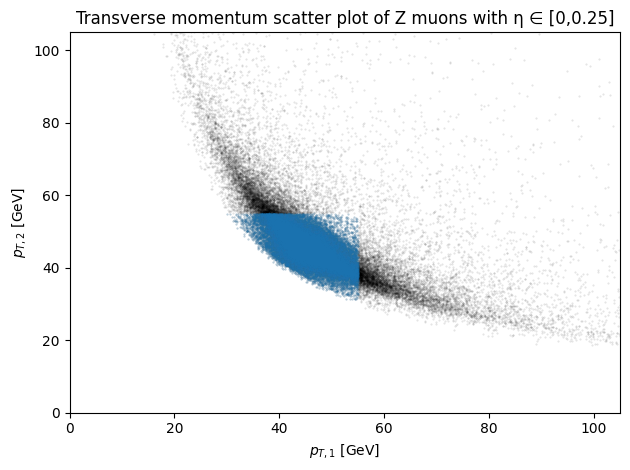

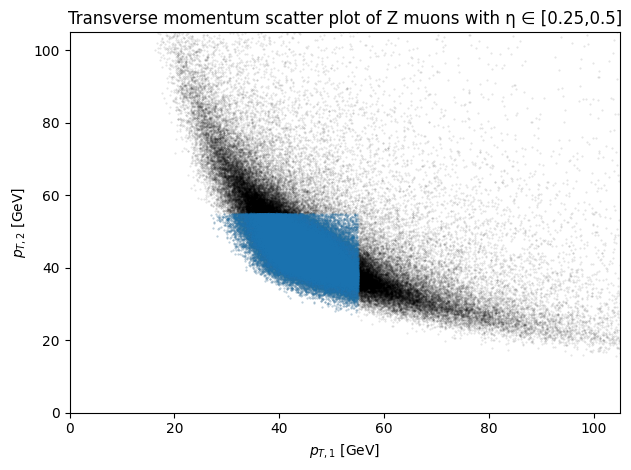

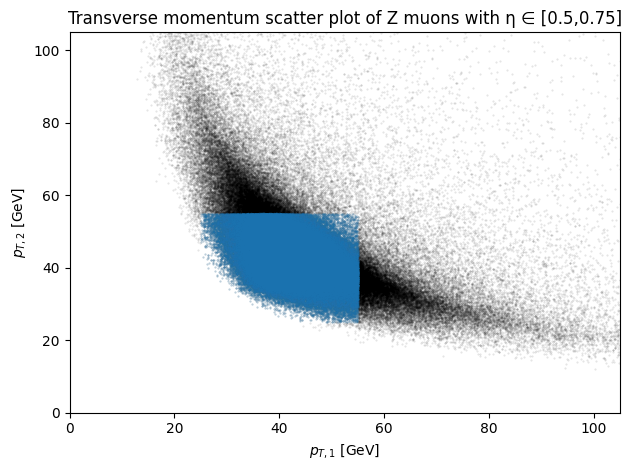

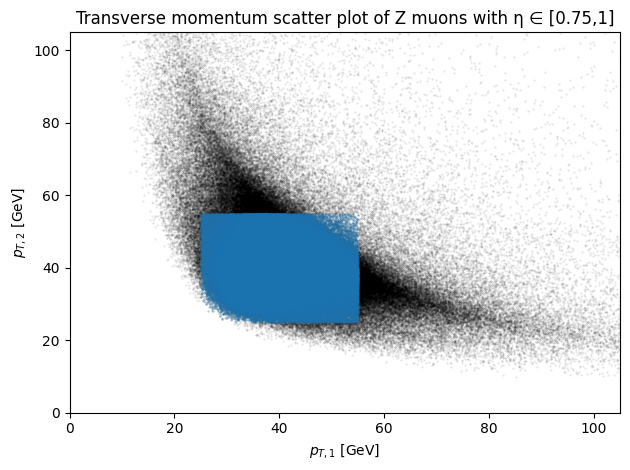

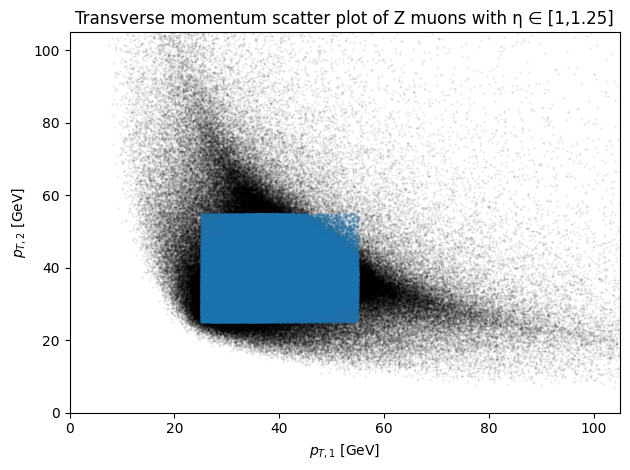

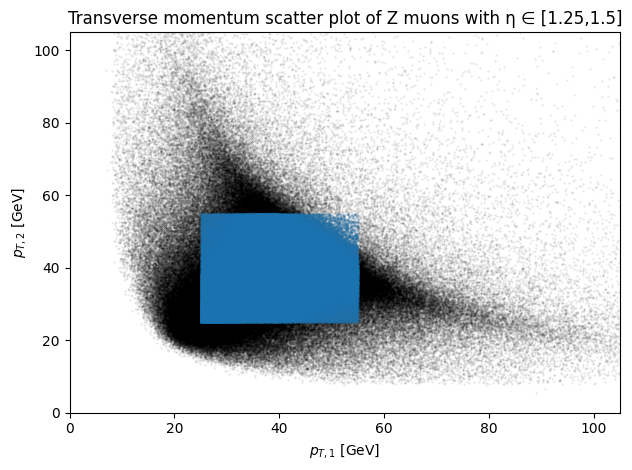

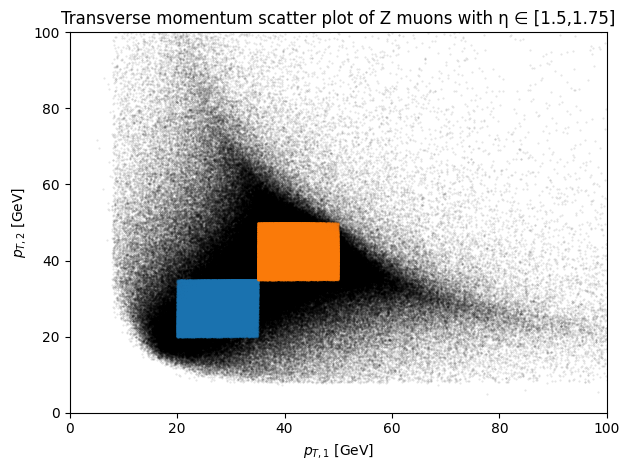

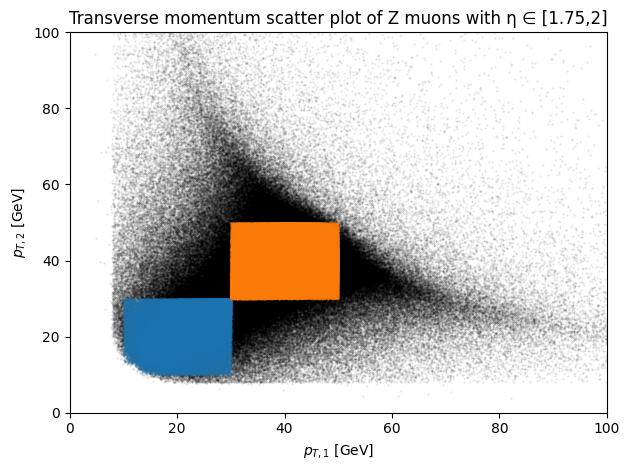

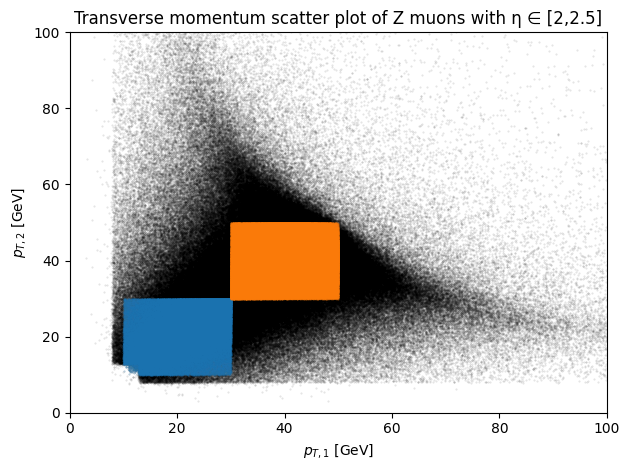

In [32]:
#setting up the Z partitions in the different bins of eta 

partitions = [] #save the data of the partitions to be used for comparison between extrapolated mass resolution and literature
names = []

for i in range(len(eta)-1):
    
    #creating eta bins
    f1 = (np.fmax(np.abs(zboson.mu1.eta.to_numpy()),np.abs(zboson.mu2.eta.to_numpy())) >= eta[i])
    f2 = (np.fmax(np.abs(zboson.mu1.eta.to_numpy()),np.abs(zboson.mu2.eta.to_numpy())) <  eta[i+1])
    f = f1 & f2
    
    titl = "Transverse momentum scatter plot of Z muons with η ∈ [" + str(eta[i]) + "," + str(eta[i+1]) + "]"
    
    #partitioning
    if i <= 5:
        xcuts = np.linspace(25,55,2)
        ycuts = np.linspace(25,55,2)
        areasZ, subsetsZ = partition(zboson[f],xcuts,ycuts,title = titl)
        
    if i > 5 and i <= 6:
        xcuts = np.linspace(20,50,3)
        ycuts = np.linspace(20,50,3)
        areasZ, subsetsZ = partition(zboson[f],xcuts,ycuts,title = titl, threshhold = 10000, diagOnly = True) 
        
    if i > 6:
        if i == 8:
            titl = "Transverse momentum scatter plot of Z muons with η ∈ [2,2.5]"
        xcuts = np.linspace(10,50,3)
        ycuts = np.linspace(10,50,3)
        areasZ, subsetsZ = partition(zboson[f],xcuts,ycuts,title = titl, threshhold = 10000, diagOnly = True) 
    
    partitions.append(subsetsZ)
    names.append(areasZ)

<div class="alert alert-warning">
   
### Estimating the accuracy of the mass resolution extrapolation

</div>

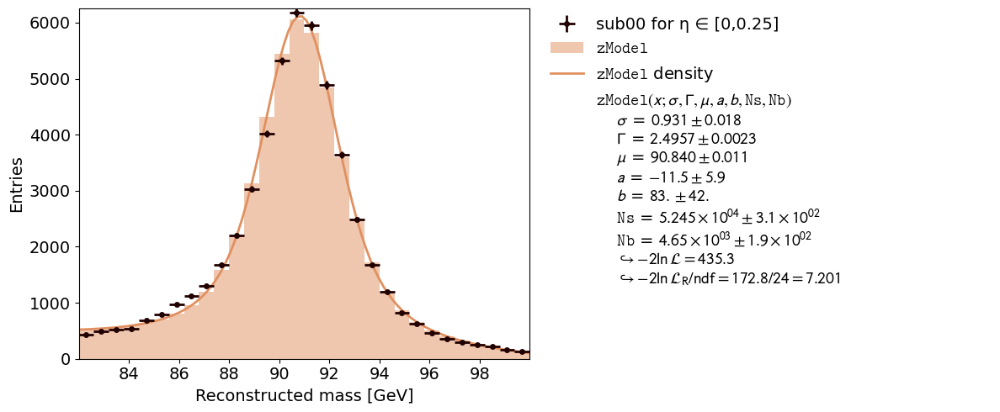

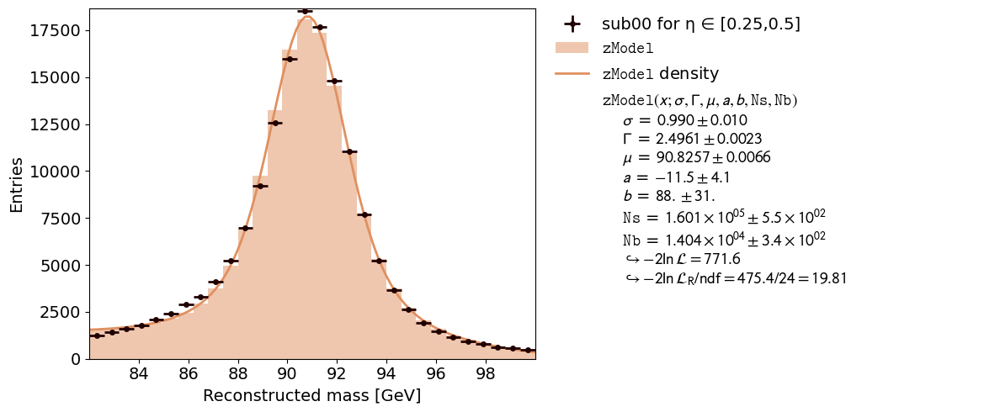

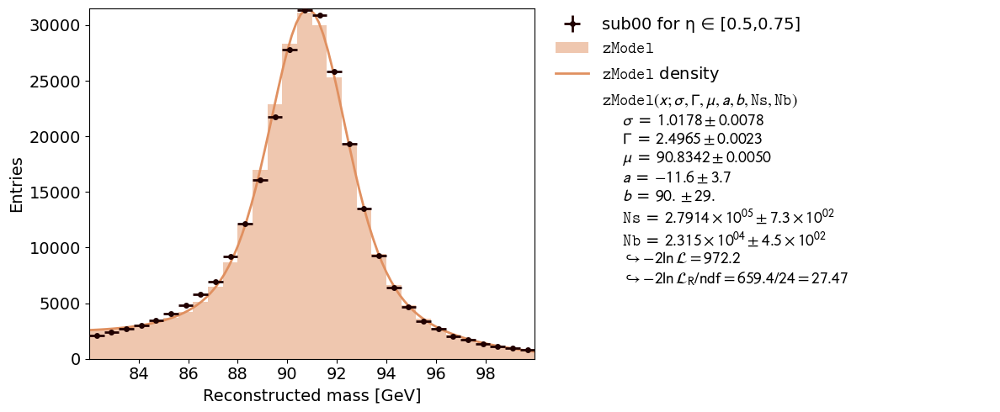

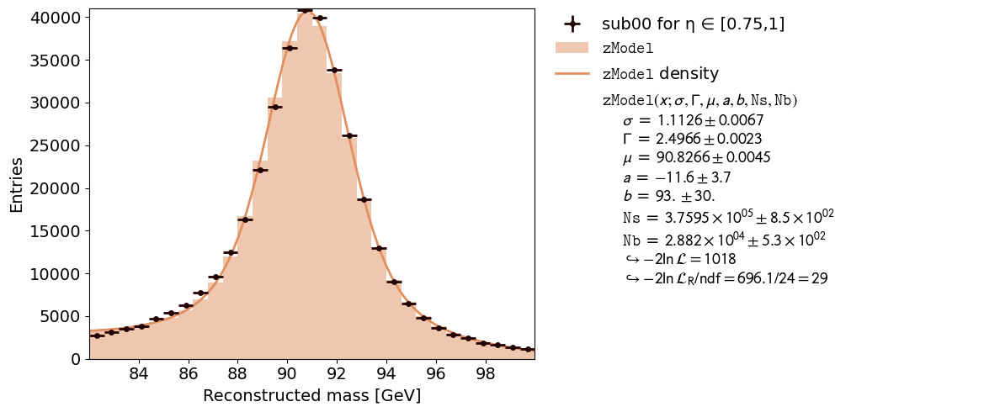

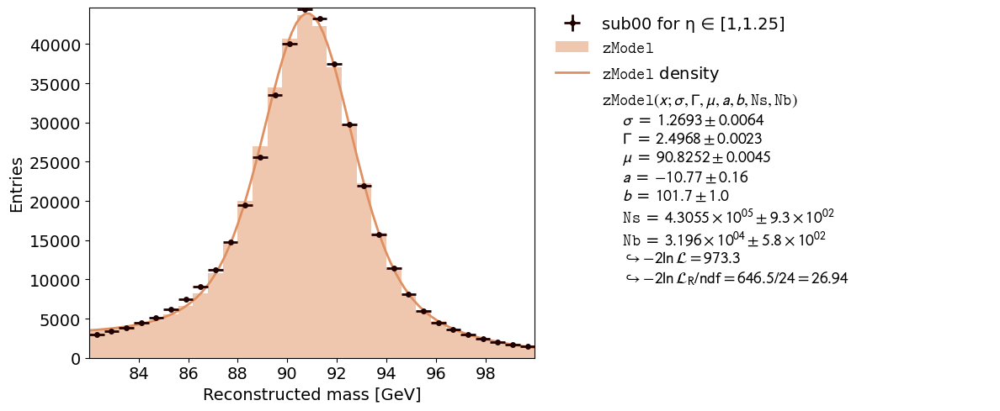

...

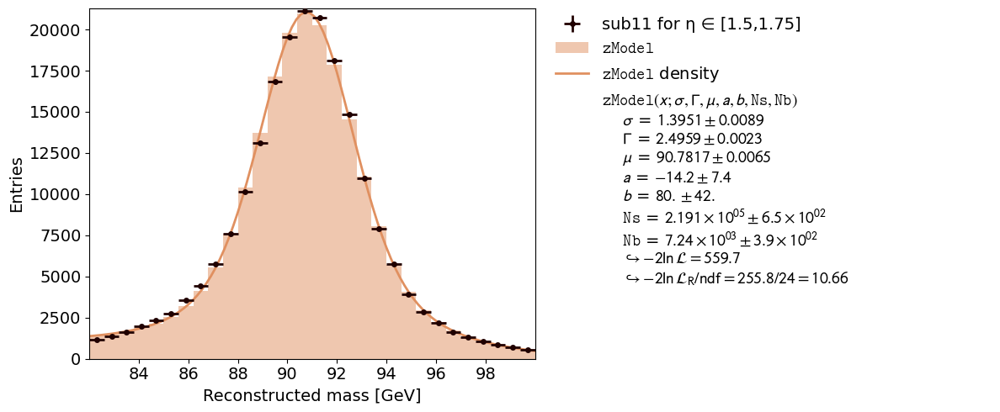

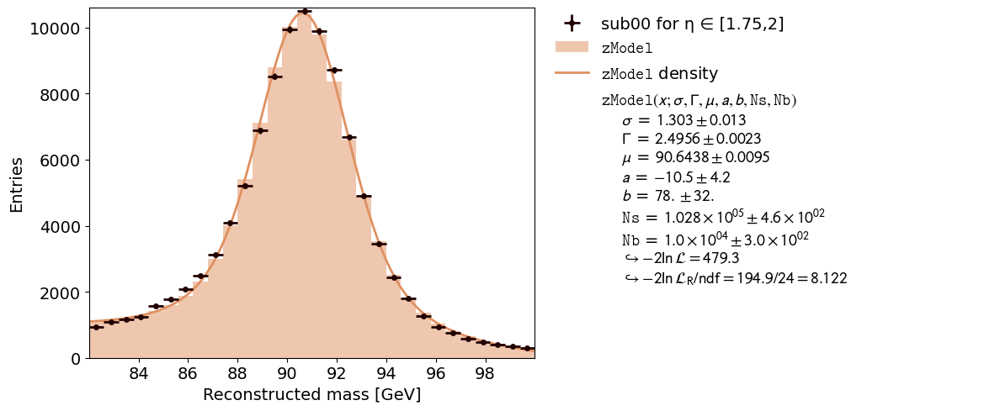

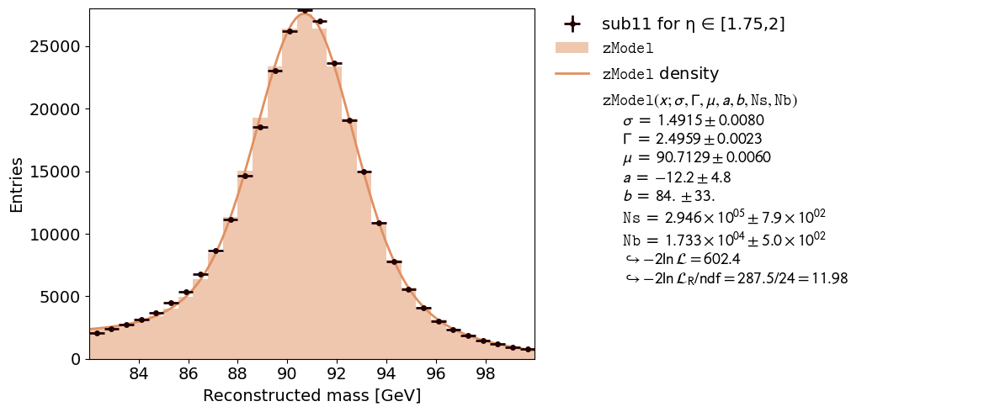

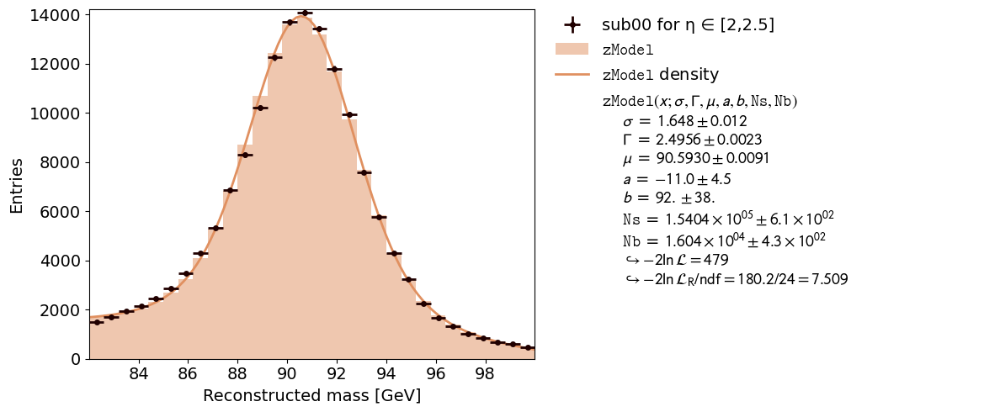

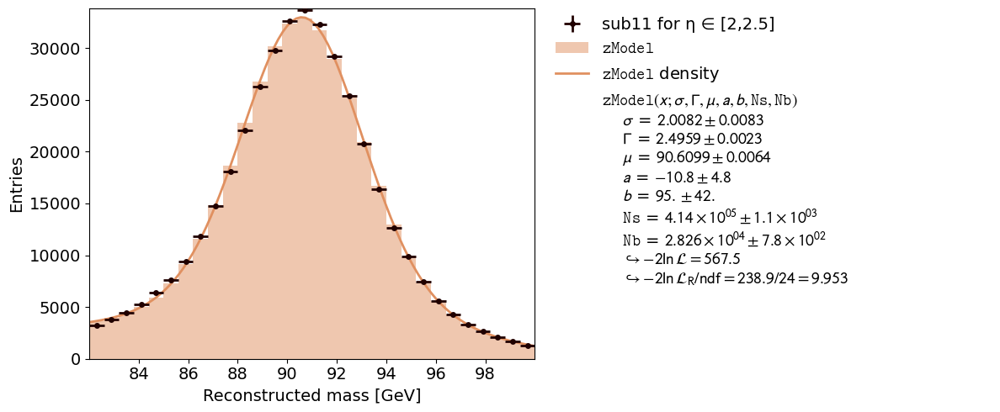

In [33]:
#set up lists to hold "literature" and calculated values for the mass resolution
fittedResoltuion = []
calculatedResolution = []
error_fittedResolution = []
error_calculatedResolution = []

#loop through eta bins
for i in range(len(names)):
    #get partitions created in this eta bin
    areas = names[i]
    subsets = partitions[i]

    #loop through all partitions in this eta bin
    for area in areas:
        #prepare Data For Fit
        massData = subsets[area,"M"].to_numpy()
        massData = massData[~(np.isnan(massData))]
        pt1 = subsets[area,"mu1pt"].to_numpy()
        pt1 = pt1[~(np.isnan(pt1))]
        pt2 = subsets[area,"mu2pt"].to_numpy()
        pt2 = pt2[~(np.isnan(pt2))]
    
        minM = np.nanmin(massData)
        maxM = np.nanmax(massData)
        histogram = kfe.HistContainer(n_bins=30, bin_range=(minM, maxM), fill_data=massData)
    
        fit = kfe.HistFit(data=histogram, model_function=zModel, density = False)
        
        index = str(i) +"_"+area #appendix that differentiates ModelFunctions / bins and partitions
        
        #parameters and their starting values         
        paramDict = {"a": -10,
                     "b": 100,
                     "sigma": 1,
                     "mu":np.mean(zboson.M.to_numpy()),
                     "Ns": 0.9 * len(massData),
                     "Nb": 0.1 * len(massData),
                     "Gamma":2.5
                    }
    
        fit.set_parameter_values(**paramDict)
        fit.limit_parameter("sigma",0,5) #must be positive

        #fix \Gamma to its literature value to gain estimate of what resolution should have been
        #Value Taken from pdg
        fit.add_parameter_constraint(name="Gamma", value=2.4955, uncertainty = 0.0023)
    
        result = fit.do_fit()  # do the fit
        fit.data_container.label = area +" for η ∈ [" + str(eta[i]) + "," + str(eta[i+1]) + "]"

        #save resutls
        fittedResoltuion.append(result["parameter_values"]["sigma"])
        error_fittedResolution.append(result["parameter_errors"]["sigma"])

        #calculate resolution based on extrapolation
        calculatedResolution.append(getmassResolutionZ(np.average(pt1),np.average(pt2),kList[i]).n)
        error_calculatedResolution.append(getmassResolutionZ(np.average(pt1),np.average(pt2),kList[i]).s)
        
        plot = kfe.plot(fit, x_label = "Reconstructed mass [GeV]")
        plot.show()
       

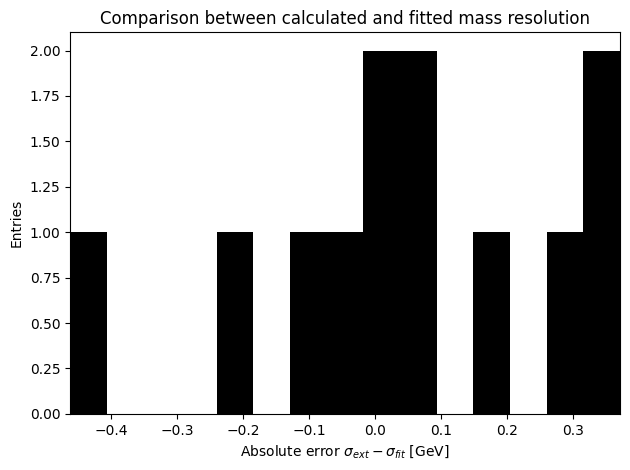

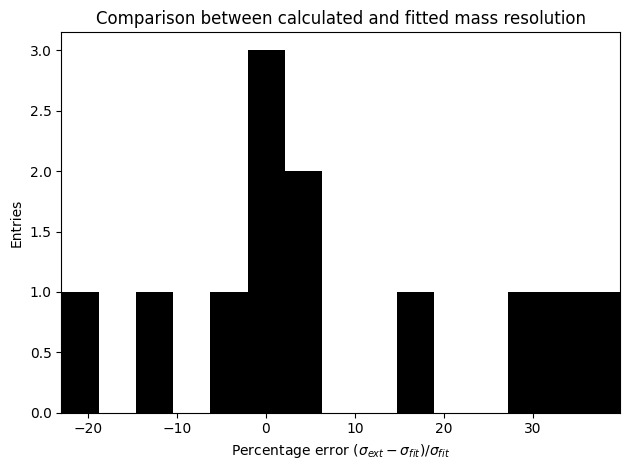

Model error :  0.23127094502792797
relModelError:  0.17631232621658452


In [34]:
#prepare comparison plot between calcuated and fittet values

calculatedResolution = np.array(calculatedResolution)
fittedResoltuion = np.array(fittedResoltuion)

#calculte and plot uncertainty of extrapolation
diff = np.array(calculatedResolution) - np.array(fittedResoltuion)
plt.hist(diff, bins = 15, color = "black")
plt.title("Comparison between calculated and fitted mass resolution")
plt.xlabel(r"Absolute error $\sigma_{ext} - \sigma_{fit}$ [GeV]")
plt.ylabel("Entries")
plt.show()

plt.hist(diff/np.array(fittedResoltuion)*100, bins = 15, color = "black")
plt.title("Comparison between calculated and fitted mass resolution")
plt.xlabel(r"Percentage error $(\sigma_{ext} - \sigma_{fit}) / \sigma_{fit}$")
plt.ylabel("Entries")
plt.show()

#calculate model uncertainty
N = len(diff)
modelError = np.sqrt(1/N * np.sum(diff*diff))
print("Model error : ", modelError)

relModelError = modelError/np.mean(fittedResoltuion)
print("relModelError: ", relModelError)

In [35]:
#prepare Z fits for multi-fit
fitList = [] #list to contain all fits for multiFit

for i in range(len(names)): #eta bins
    areas = names[i]
    subsets = partitions[i]
    
    for area in areas:
        massData = subsets[area,"M"].to_numpy()
        massData = massData[~(np.isnan(massData))]
        pt1 = subsets[area,"mu1pt"].to_numpy()
        pt1 = pt1[~(np.isnan(pt1))]
        pt2 = subsets[area,"mu2pt"].to_numpy()
        pt2 = pt2[~(np.isnan(pt2))]
    
        minM = np.nanmin(massData)
        maxM = np.nanmax(massData)
        histogram = kfe.HistContainer(n_bins=30, bin_range=(minM, maxM), fill_data=massData)
    
        index = str(i) +"_"+area #appendix that differentiates ModelFunctions
    
        massResolution = getmassResolutionZ(np.mean(pt1),np.mean(pt2),kList[i])
    
        #parameters and their starting values
        paramDict = {"a"+index : -8,
                     "b"+index : 100,
                     "sigma"+index: massResolution.n,
                     "Gamma": 2.5,
                     "mu":MZ.n,
                     "Ns"+ index : 0.95 * len(massData),
                     "Nb"+ index : 0.05 * len(massData)
                    }
                    
        fit = kfe.HistFit(data=histogram, model_function=funcdict[index], density = False)
        #set starting parameters to ensure convergence
        fit.set_parameter_values(**paramDict)
        
        #fix the determined uncertainty in the area
        fit.add_parameter_constraint(name="sigma"+index,value=massResolution.n, uncertainty = modelError) 
        
        fit.data_container.label = area +" for η ∈ [" + str(eta[i]) + "," + str(eta[i+1]) + "]"
    
        fit.limit_parameter("Ns"+area,0,massData.size)
        fit.limit_parameter("Nb"+area,0,massData.size)
        fit.limit_parameter("Gamma",1,4 )
        #append to list of fits for multi fit
        fitList.append(fit)

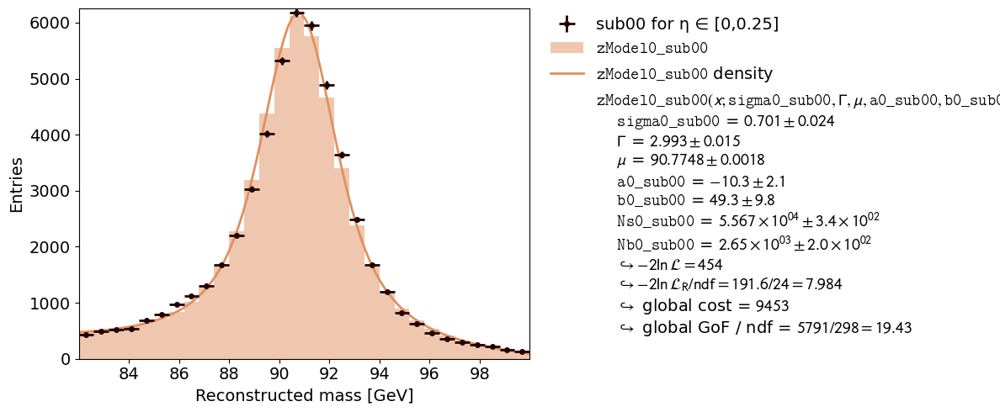

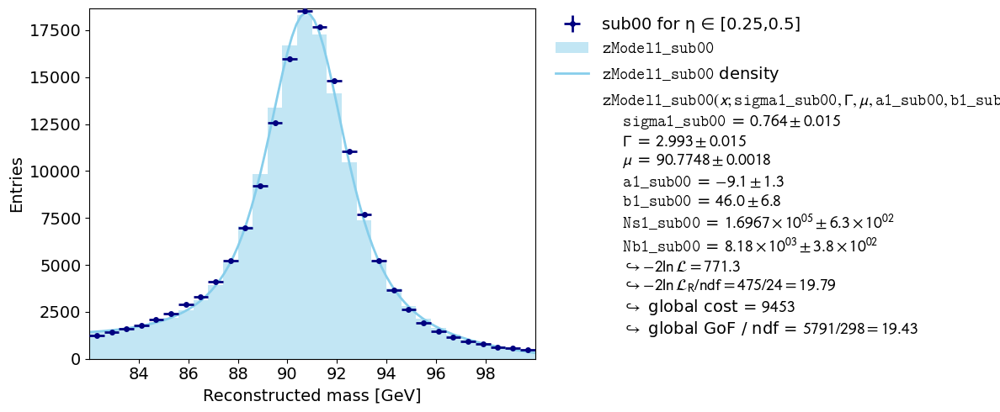

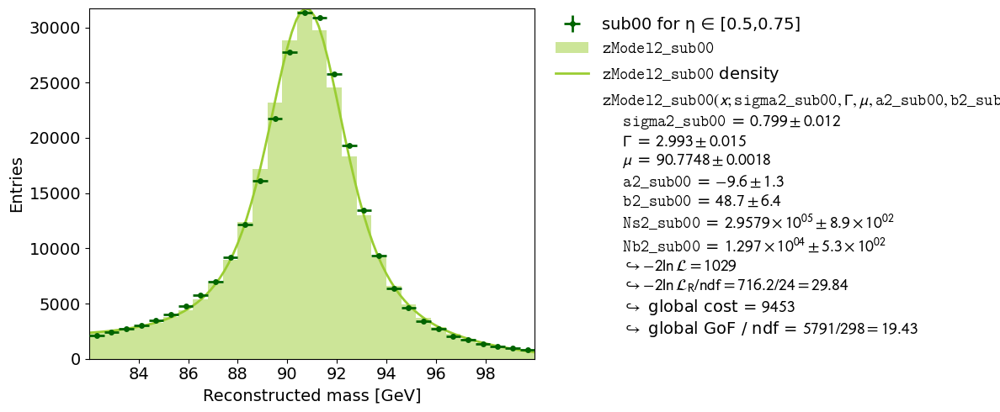

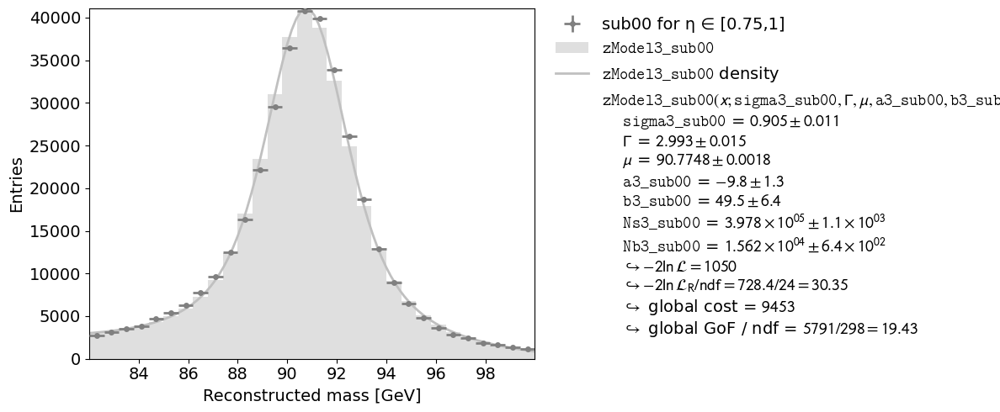

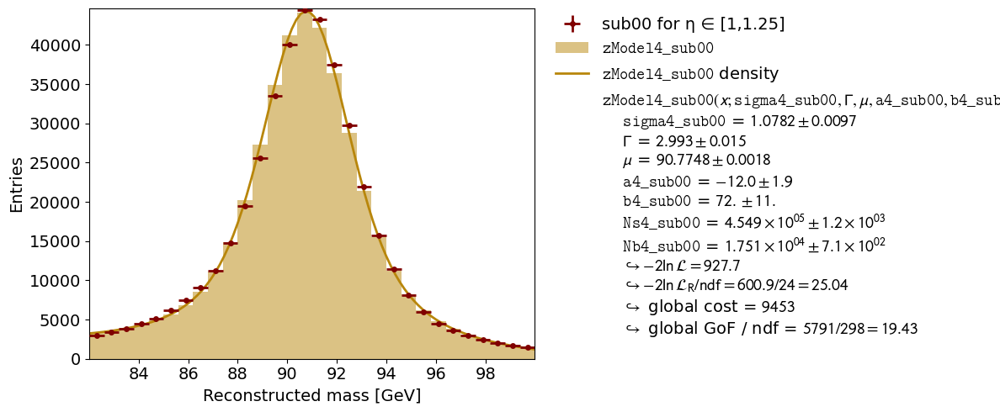

...

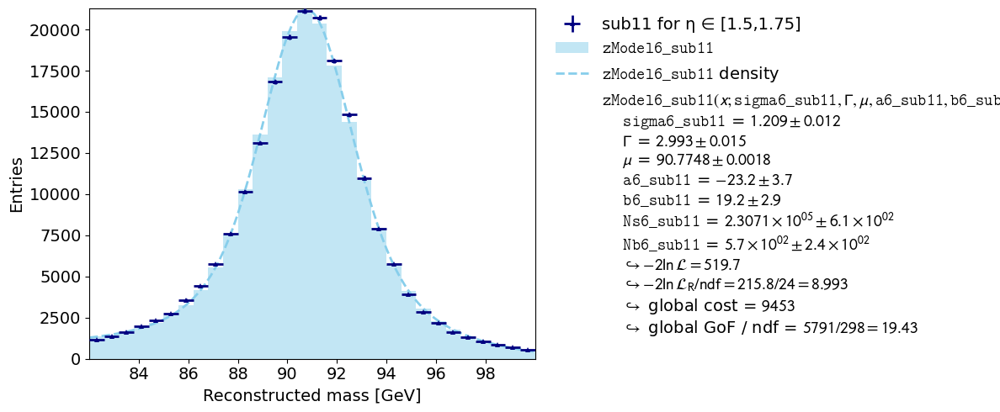

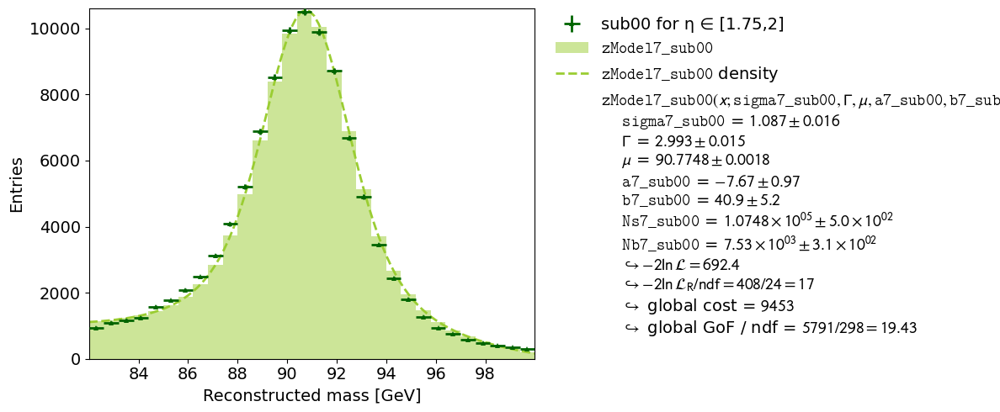

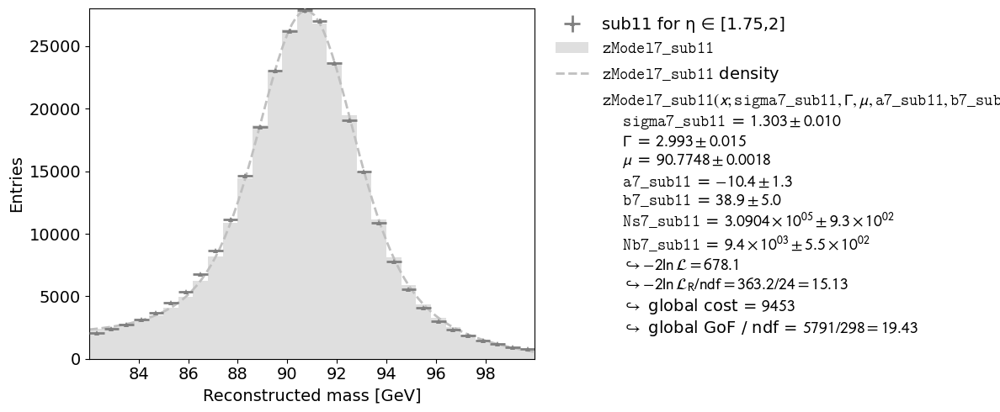

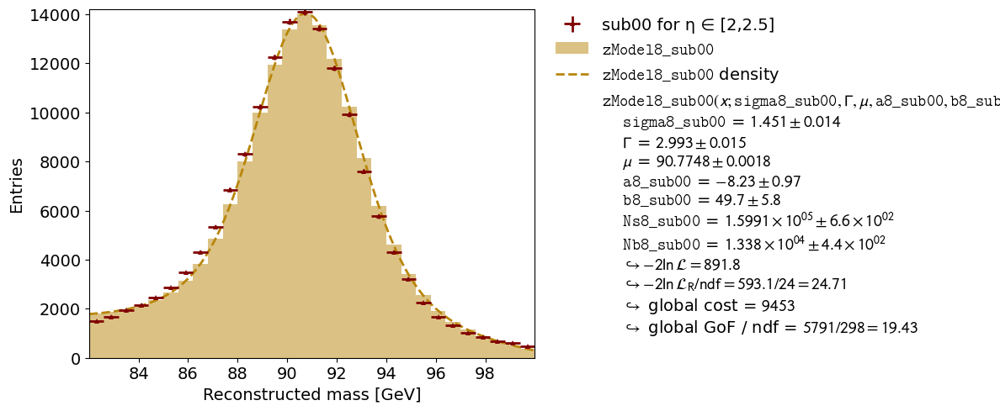

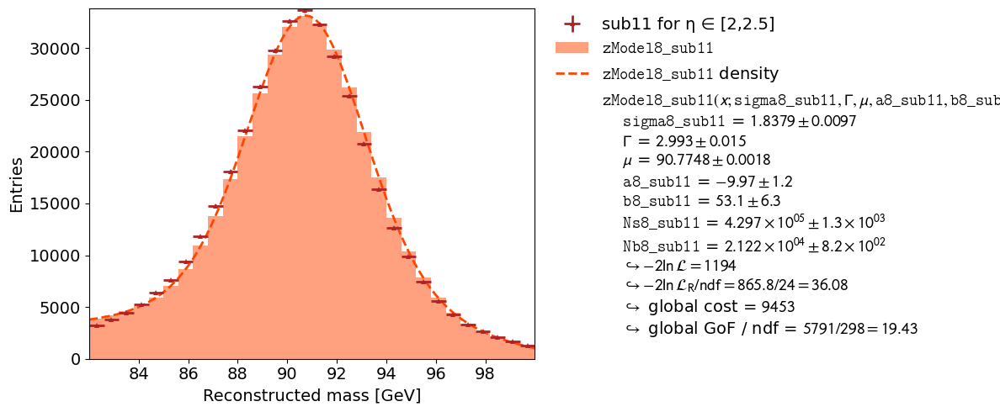

In [36]:
#Perform Multi Fit 
multi_fit = kfe.MultiFit(fit_list=fitList)
res = multi_fit.do_fit()
plot = kfe.Plot(multi_fit, separate_figures=True)
plot.x_label = "Reconstructed mass [GeV]"
plot.plot()
plot.show()